# Environment Setup

In [12]:
!pip install missingno fuzzywuzzy fancyimpute

In [211]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno
from scipy import stats
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.feature_selection import VarianceThreshold
from sklearn.linear_model import LassoCV
from sklearn.feature_selection import RFE
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from fuzzywuzzy import process
from fancyimpute import KNN
from fancyimpute import IterativeImputer
import statsmodels.api as sm    

pd.set_option('display.max_columns', 100)
from IPython.core.interactiveshell import InteractiveShell
# InteractiveShell.ast_node_interactivity = "all"
plt.rcParams["figure.autolayout"] = True
custom_params = {"axes.spines.right": False, "axes.spines.top": False}
sns.set_theme(style="white", rc=custom_params, palette="Set2")

In [14]:
filename = "./src/Medical Data/medical_raw_data.csv"

# Part 0: Data Exploration

In [15]:
df = pd.read_csv(filename)
# df.drop("Unnamed: 0", 1)

In [16]:
df.dtypes
print(df.shape, end="\n\n")
print(df.columns, end="\n\n")
print(df.index, end="\n\n")
df.info()

(10000, 53)

Index(['Unnamed: 0', 'CaseOrder', 'Customer_id', 'Interaction', 'UID', 'City',
       'State', 'County', 'Zip', 'Lat', 'Lng', 'Population', 'Area',
       'Timezone', 'Job', 'Children', 'Age', 'Education', 'Employment',
       'Income', 'Marital', 'Gender', 'ReAdmis', 'VitD_levels', 'Doc_visits',
       'Full_meals_eaten', 'VitD_supp', 'Soft_drink', 'Initial_admin',
       'HighBlood', 'Stroke', 'Complication_risk', 'Overweight', 'Arthritis',
       'Diabetes', 'Hyperlipidemia', 'BackPain', 'Anxiety',
       'Allergic_rhinitis', 'Reflux_esophagitis', 'Asthma', 'Services',
       'Initial_days', 'TotalCharge', 'Additional_charges', 'Item1', 'Item2',
       'Item3', 'Item4', 'Item5', 'Item6', 'Item7', 'Item8'],
      dtype='object')

RangeIndex(start=0, stop=10000, step=1)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 53 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  ----- 

In [17]:
df['Population'].describe()
df.describe()

,Unnamed: 0,CaseOrder,Zip,Lat,Lng,Population,Children,Age,Income,VitD_levels,Doc_visits,Full_meals_eaten,VitD_supp,Overweight,Anxiety,Initial_days,TotalCharge,Additional_charges,Item1,Item2,Item3,Item4,Item5,Item6,Item7,Item8
count,10000.00000,10000.00000,10000.000000,10000.000000,10000.000000,10000.000000,7412.000000,7586.000000,7536.000000,10000.000000,10000.000000,10000.000000,10000.000000,9018.000000,9016.000000,8944.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000
mean,5000.50000,5000.50000,50159.323900,38.751099,-91.243080,9965.253800,2.098219,53.295676,40484.438268,19.412675,5.012200,1.001400,0.398900,0.709137,0.322316,34.432082,5891.538261,12934.528586,3.518800,3.506700,3.511100,3.515100,3.496900,3.522500,3.494000,3.509700
std,2886.89568,2886.89568,27469.588208,5.403085,15.205998,14824.758614,2.155427,20.659182,28664.861050,6.723277,1.045734,1.008117,0.628505,0.454186,0.467389,26.287050,3377.558136,6542.601544,1.031966,1.034825,1.032755,1.036282,1.030192,1.032376,1.021405,1.042312
min,1.00000,1.00000,610.000000,17.967190,-174.209690,0.000000,0.000000,18.000000,154.080000,9.519012,1.000000,0.000000,0.000000,0.000000,0.000000,1.001981,1256.751699,3125.702716,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,2500.75000,2500.75000,27592.000000,35.255120,-97.352982,694.750000,0.000000,35.000000,19450.792500,16.513171,4.000000,0.000000,0.000000,0.000000,0.000000,7.911709,3253.239465,7986.487642,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000
50%,5000.50000,5000.50000,50207.000000,39.419355,-88.397230,2769.000000,1.000000,53.000000,33942.280000,18.080560,5.000000,1.000000,0.000000,1.000000,0.000000,34.446941,5852.250564,11573.979365,4.000000,3.000000,4.000000,4.000000,3.000000,4.000000,3.000000,3.000000
75%,7500.25000,7500.25000,72411.750000,42.044175,-80.438050,13945.000000,3.000000,71.000000,54075.235000,19.789740,6.000000,2.000000,1.000000,1.000000,1.000000,61.124654,7614.989701,15626.491033,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000
max,10000.00000,10000.00000,99929.000000,70.560990,-65.290170,122814.000000,10.000000,89.000000,207249.130000,53.019124,9.000000,7.000000,5.000000,1.000000,1.000000,71.981486,21524.224210,30566.073130,8.000000,7.000000,8.000000,7.000000,7.000000,7.000000,7.000000,7.000000


In [18]:
# merges datatypes with sample data
x = pd.DataFrame(df.dtypes).reset_index().rename(columns={'index':'Feature', 0: "Data Type"})
df2 = df.head(1).transpose().reset_index(drop=True).rename(columns={0: "Sample Value"})
pd.concat([x, df2], axis=1)

,Feature,Data Type,Sample Value
0,Unnamed: 0,int64,1
1,CaseOrder,int64,1
2,Customer_id,object,C412403
3,Interaction,object,8cd49b13-f45a-4b47-a2bd-173ffa932c2f
4,UID,object,3a83ddb66e2ae73798bdf1d705dc0932
5,City,object,Eva
6,State,object,AL
7,County,object,Morgan
8,Zip,int64,35621
9,Lat,float64,34.3496


In [19]:
df.head() 

,Unnamed: 0,CaseOrder,Customer_id,Interaction,UID,City,State,County,Zip,Lat,Lng,Population,Area,Timezone,Job,Children,Age,Education,Employment,Income,Marital,Gender,ReAdmis,VitD_levels,Doc_visits,Full_meals_eaten,VitD_supp,Soft_drink,Initial_admin,HighBlood,Stroke,Complication_risk,Overweight,Arthritis,Diabetes,Hyperlipidemia,BackPain,Anxiety,Allergic_rhinitis,Reflux_esophagitis,Asthma,Services,Initial_days,TotalCharge,Additional_charges,Item1,Item2,Item3,Item4,Item5,Item6,Item7,Item8
0,1,1,C412403,8cd49b13-f45a-4b47-a2bd-173ffa932c2f,3a83ddb66e2ae73798bdf1d705dc0932,Eva,AL,Morgan,35621,34.34960,-86.72508,2951,Suburban,America/Chicago,"Psychologist, sport and exercise",1.0,53.0,"Some College, Less than 1 Year",Full Time,86575.93,Divorced,Male,No,17.802330,6,0,0,NaN,Emergency Admission,Yes,No,Medium,0.0,Yes,Yes,No,Yes,1.0,Yes,No,Yes,Blood Work,10.585770,3191.048774,17939.403420,3,3,2,2,4,3,3,4
1,2,2,Z919181,d2450b70-0337-4406-bdbb-bc1037f1734c,176354c5eef714957d486009feabf195,Marianna,FL,Jackson,32446,30.84513,-85.22907,11303,Urban,America/Chicago,Community development worker,3.0,51.0,"Some College, 1 or More Years, No Degree",Full Time,46805.99,Married,Female,No,18.994640,4,2,1,No,Emergency Admission,Yes,No,High,1.0,No,No,No,No,NaN,No,Yes,No,Intravenous,15.129562,4214.905346,17612.998120,3,4,3,4,4,4,3,3
2,3,3,F995323,a2057123-abf5-4a2c-abad-8ffe33512562,e19a0fa00aeda885b8a436757e889bc9,Sioux Falls,SD,Minnehaha,57110,43.54321,-96.63772,17125,Suburban,America/Chicago,Chief Executive Officer,3.0,53.0,"Some College, 1 or More Years, No Degree",Retired,14370.14,Widowed,Female,No,17.415889,4,1,0,No,Elective Admission,Yes,No,Medium,1.0,No,Yes,No,No,NaN,No,No,No,Blood Work,4.772177,2177.586768,17505.192460,2,4,4,4,3,4,3,3
3,4,4,A879973,1dec528d-eb34-4079-adce-0d7a40e82205,cd17d7b6d152cb6f23957346d11c3f07,New Richland,MN,Waseca,56072,43.89744,-93.51479,2162,Suburban,America/Chicago,Early years teacher,0.0,78.0,GED or Alternative Credential,Retired,39741.49,Married,Male,No,17.420079,4,1,0,No,Elective Admission,No,Yes,Medium,0.0,Yes,No,No,No,NaN,No,Yes,Yes,Blood Work,1.714879,2465.118965,12993.437350,3,5,5,3,4,5,5,5
4,5,5,C544523,5885f56b-d6da-43a3-8760-83583af94266,d2f0425877b10ed6bb381f3e2579424a,West Point,VA,King William,23181,37.59894,-76.88958,5287,Rural,America/New_York,Health promotion specialist,NaN,22.0,Regular High School Diploma,Full Time,1209.56,Widowed,Female,No,16.870524,5,0,2,Yes,Elective Admission,No,No,Low,0.0,No,No,Yes,No,0.0,Yes,No,No,CT Scan,1.254807,1885.655137,3716.525786,2,1,3,3,5,3,4,3


In [20]:
(df.isna().sum()/len(df) * 100).sort_values(ascending=False)

Children              25.88
Soft_drink            24.67
Income                24.64
Age                   24.14
Initial_days          10.56
Anxiety                9.84
Overweight             9.82
Stroke                 0.00
Complication_risk      0.00
Arthritis              0.00
Diabetes               0.00
Hyperlipidemia         0.00
BackPain               0.00
Allergic_rhinitis      0.00
Unnamed: 0             0.00
HighBlood              0.00
Asthma                 0.00
Services               0.00
TotalCharge            0.00
Additional_charges     0.00
Item1                  0.00
Item2                  0.00
Item3                  0.00
Item4                  0.00
Item5                  0.00
Item6                  0.00
Item7                  0.00
Reflux_esophagitis     0.00
VitD_supp              0.00
Initial_admin          0.00
CaseOrder              0.00
Customer_id            0.00
Interaction            0.00
UID                    0.00
City                   0.00
State               

Children, Soft_drink, Income and Age have approximately 25% of their values missings

# Part I: Research Question
---

## A. Question or Decision ✅

The description states a question or decision that can be addressed through analysis of the chosen data set. The question or decision is relevant to a realistic organizational need or situation.

**A.  Describe one question or decision that you will address using the data set you chose. The summarized question or decision must be relevant to a realistic organizational need or situation.**

To understand where to focus readmission reduction efforts for the Acme Hospital Chain. The Analyst team is tasked with researching...

- **What relationship(s) exists between readmitted patients and their Geographical Area type (rural, urban, suburban)?**

- What relationship exists between readmitted patients the Level of complication risk for the patient as assessed by a primary patient assessment?

- What relationship(s) exists between readmitted patients, the number of days the patient stayed in the hospital during the initial visit, the average amount charged to the patient for miscellaneous procedures, treatments, medicines?


## B. Required Variables
The description includes the variables in the data set and indicates the specific type of data being described, and includes examples from the data set to support claims.

**B.  Describe the variables in the data set and indicate the specific type of data being described. Use examples from the data set that support your claims.**


In [21]:
# merges datatypes with sample data

# create a dataframe from "dtypes"
x = pd.DataFrame(df.dtypes).reset_index().rename(columns={'index':'Feature', 0: "Data Type"})

# take the first record to use for sample values
sample_df = df.head(1).transpose().reset_index(drop=True).rename(columns={0: "Sample Value"})

# combine the "dtypes" and sample value into a dataframe
pd.concat([x, sample_df], axis=1)

# see "D206 Data Cleaning_ Medical Data Considerations and Dictionary" for feature descriptions

# see if any column values are different
df[df["Unnamed: 0"] != df["CaseOrder"]]

,Unnamed: 0,CaseOrder,Customer_id,Interaction,UID,City,State,County,Zip,Lat,Lng,Population,Area,Timezone,Job,Children,Age,Education,Employment,Income,Marital,Gender,ReAdmis,VitD_levels,Doc_visits,Full_meals_eaten,VitD_supp,Soft_drink,Initial_admin,HighBlood,Stroke,Complication_risk,Overweight,Arthritis,Diabetes,Hyperlipidemia,BackPain,Anxiety,Allergic_rhinitis,Reflux_esophagitis,Asthma,Services,Initial_days,TotalCharge,Additional_charges,Item1,Item2,Item3,Item4,Item5,Item6,Item7,Item8


# Part II: Data-Cleaning Plan

The proposal includes a detailed description of the techniques and steps needed for identifying anomalies in the selected data set.
---

1. Examine the entire dataset (regardless of your research question).

2. Detection and Treatment of Duplicates, Missing Values and Outlier(check for outliers for all numeric variables).*

3. Re express Categorical Variables, if possible (this is optional, but suggested)

4. Perform PCA (with numerical variables only)

## C1: Plan to Find Anomalies
Explain the plan for cleaning the data by doing the following:

1.  Propose a plan that includes the relevant techniques and specific steps needed to identify anomalies in the data set.

### Understanding the dataset

In [22]:
df.shape

(10000, 53)

In [23]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 53 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Unnamed: 0          10000 non-null  int64  
 1   CaseOrder           10000 non-null  int64  
 2   Customer_id         10000 non-null  object 
 3   Interaction         10000 non-null  object 
 4   UID                 10000 non-null  object 
 5   City                10000 non-null  object 
 6   State               10000 non-null  object 
 7   County              10000 non-null  object 
 8   Zip                 10000 non-null  int64  
 9   Lat                 10000 non-null  float64
 10  Lng                 10000 non-null  float64
 11  Population          10000 non-null  int64  
 12  Area                10000 non-null  object 
 13  Timezone            10000 non-null  object 
 14  Job                 10000 non-null  object 
 15  Children            7412 non-null   float64
 16  Age  

In [24]:
# merges datatypes with sample data

# create a dataframe from "dtypes"
x = pd.DataFrame(df.dtypes).reset_index().rename(columns={'index':'Feature', 0: "Data Type"})

# take the first record to use for sample values
sample_df = df.head(1).transpose().reset_index(drop=True).rename(columns={0: "Sample Value"})

# combine the "dtypes" and sample value into a dataframe
pd.concat([x, sample_df], axis=1)

,Feature,Data Type,Sample Value
0,Unnamed: 0,int64,1
1,CaseOrder,int64,1
2,Customer_id,object,C412403
3,Interaction,object,8cd49b13-f45a-4b47-a2bd-173ffa932c2f
4,UID,object,3a83ddb66e2ae73798bdf1d705dc0932
5,City,object,Eva
6,State,object,AL
7,County,object,Morgan
8,Zip,int64,35621
9,Lat,float64,34.3496


In [25]:
df_tp = df.head(1).transpose()
# store the value's python data type
df_tp["Python Data Type"] = df_tp[0].apply(type)
# store the value's pandas data type
df_tp["Pandas Data Type"] = df.dtypes
# rename cols
df_tp = df_tp.reset_index().rename(columns={'index':'Feature', 0: "Sample Value"})
# reorder columns
df_tp.reindex(columns=["Feature", "Pandas Data Type", "Python Data Type", "Sample Value"])

,Feature,Pandas Data Type,Python Data Type,Sample Value
0,Unnamed: 0,int64,<class 'int'>,1
1,CaseOrder,int64,<class 'int'>,1
2,Customer_id,object,<class 'str'>,C412403
3,Interaction,object,<class 'str'>,8cd49b13-f45a-4b47-a2bd-173ffa932c2f
4,UID,object,<class 'str'>,3a83ddb66e2ae73798bdf1d705dc0932
5,City,object,<class 'str'>,Eva
6,State,object,<class 'str'>,AL
7,County,object,<class 'str'>,Morgan
8,Zip,int64,<class 'int'>,35621
9,Lat,float64,<class 'float'>,34.3496


In [26]:
df.columns

Index(['Unnamed: 0', 'CaseOrder', 'Customer_id', 'Interaction', 'UID', 'City',
       'State', 'County', 'Zip', 'Lat', 'Lng', 'Population', 'Area',
       'Timezone', 'Job', 'Children', 'Age', 'Education', 'Employment',
       'Income', 'Marital', 'Gender', 'ReAdmis', 'VitD_levels', 'Doc_visits',
       'Full_meals_eaten', 'VitD_supp', 'Soft_drink', 'Initial_admin',
       'HighBlood', 'Stroke', 'Complication_risk', 'Overweight', 'Arthritis',
       'Diabetes', 'Hyperlipidemia', 'BackPain', 'Anxiety',
       'Allergic_rhinitis', 'Reflux_esophagitis', 'Asthma', 'Services',
       'Initial_days', 'TotalCharge', 'Additional_charges', 'Item1', 'Item2',
       'Item3', 'Item4', 'Item5', 'Item6', 'Item7', 'Item8'],
      dtype='object')

In [27]:
df.index

RangeIndex(start=0, stop=10000, step=1)

In [28]:
df.describe()

,Unnamed: 0,CaseOrder,Zip,Lat,Lng,Population,Children,Age,Income,VitD_levels,Doc_visits,Full_meals_eaten,VitD_supp,Overweight,Anxiety,Initial_days,TotalCharge,Additional_charges,Item1,Item2,Item3,Item4,Item5,Item6,Item7,Item8
count,10000.00000,10000.00000,10000.000000,10000.000000,10000.000000,10000.000000,7412.000000,7586.000000,7536.000000,10000.000000,10000.000000,10000.000000,10000.000000,9018.000000,9016.000000,8944.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000
mean,5000.50000,5000.50000,50159.323900,38.751099,-91.243080,9965.253800,2.098219,53.295676,40484.438268,19.412675,5.012200,1.001400,0.398900,0.709137,0.322316,34.432082,5891.538261,12934.528586,3.518800,3.506700,3.511100,3.515100,3.496900,3.522500,3.494000,3.509700
std,2886.89568,2886.89568,27469.588208,5.403085,15.205998,14824.758614,2.155427,20.659182,28664.861050,6.723277,1.045734,1.008117,0.628505,0.454186,0.467389,26.287050,3377.558136,6542.601544,1.031966,1.034825,1.032755,1.036282,1.030192,1.032376,1.021405,1.042312
min,1.00000,1.00000,610.000000,17.967190,-174.209690,0.000000,0.000000,18.000000,154.080000,9.519012,1.000000,0.000000,0.000000,0.000000,0.000000,1.001981,1256.751699,3125.702716,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,2500.75000,2500.75000,27592.000000,35.255120,-97.352982,694.750000,0.000000,35.000000,19450.792500,16.513171,4.000000,0.000000,0.000000,0.000000,0.000000,7.911709,3253.239465,7986.487642,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000
50%,5000.50000,5000.50000,50207.000000,39.419355,-88.397230,2769.000000,1.000000,53.000000,33942.280000,18.080560,5.000000,1.000000,0.000000,1.000000,0.000000,34.446941,5852.250564,11573.979365,4.000000,3.000000,4.000000,4.000000,3.000000,4.000000,3.000000,3.000000
75%,7500.25000,7500.25000,72411.750000,42.044175,-80.438050,13945.000000,3.000000,71.000000,54075.235000,19.789740,6.000000,2.000000,1.000000,1.000000,1.000000,61.124654,7614.989701,15626.491033,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000
max,10000.00000,10000.00000,99929.000000,70.560990,-65.290170,122814.000000,10.000000,89.000000,207249.130000,53.019124,9.000000,7.000000,5.000000,1.000000,1.000000,71.981486,21524.224210,30566.073130,8.000000,7.000000,8.000000,7.000000,7.000000,7.000000,7.000000,7.000000


In [29]:
df.head()

,Unnamed: 0,CaseOrder,Customer_id,Interaction,UID,City,State,County,Zip,Lat,Lng,Population,Area,Timezone,Job,Children,Age,Education,Employment,Income,Marital,Gender,ReAdmis,VitD_levels,Doc_visits,Full_meals_eaten,VitD_supp,Soft_drink,Initial_admin,HighBlood,Stroke,Complication_risk,Overweight,Arthritis,Diabetes,Hyperlipidemia,BackPain,Anxiety,Allergic_rhinitis,Reflux_esophagitis,Asthma,Services,Initial_days,TotalCharge,Additional_charges,Item1,Item2,Item3,Item4,Item5,Item6,Item7,Item8
0,1,1,C412403,8cd49b13-f45a-4b47-a2bd-173ffa932c2f,3a83ddb66e2ae73798bdf1d705dc0932,Eva,AL,Morgan,35621,34.34960,-86.72508,2951,Suburban,America/Chicago,"Psychologist, sport and exercise",1.0,53.0,"Some College, Less than 1 Year",Full Time,86575.93,Divorced,Male,No,17.802330,6,0,0,NaN,Emergency Admission,Yes,No,Medium,0.0,Yes,Yes,No,Yes,1.0,Yes,No,Yes,Blood Work,10.585770,3191.048774,17939.403420,3,3,2,2,4,3,3,4
1,2,2,Z919181,d2450b70-0337-4406-bdbb-bc1037f1734c,176354c5eef714957d486009feabf195,Marianna,FL,Jackson,32446,30.84513,-85.22907,11303,Urban,America/Chicago,Community development worker,3.0,51.0,"Some College, 1 or More Years, No Degree",Full Time,46805.99,Married,Female,No,18.994640,4,2,1,No,Emergency Admission,Yes,No,High,1.0,No,No,No,No,NaN,No,Yes,No,Intravenous,15.129562,4214.905346,17612.998120,3,4,3,4,4,4,3,3
2,3,3,F995323,a2057123-abf5-4a2c-abad-8ffe33512562,e19a0fa00aeda885b8a436757e889bc9,Sioux Falls,SD,Minnehaha,57110,43.54321,-96.63772,17125,Suburban,America/Chicago,Chief Executive Officer,3.0,53.0,"Some College, 1 or More Years, No Degree",Retired,14370.14,Widowed,Female,No,17.415889,4,1,0,No,Elective Admission,Yes,No,Medium,1.0,No,Yes,No,No,NaN,No,No,No,Blood Work,4.772177,2177.586768,17505.192460,2,4,4,4,3,4,3,3
3,4,4,A879973,1dec528d-eb34-4079-adce-0d7a40e82205,cd17d7b6d152cb6f23957346d11c3f07,New Richland,MN,Waseca,56072,43.89744,-93.51479,2162,Suburban,America/Chicago,Early years teacher,0.0,78.0,GED or Alternative Credential,Retired,39741.49,Married,Male,No,17.420079,4,1,0,No,Elective Admission,No,Yes,Medium,0.0,Yes,No,No,No,NaN,No,Yes,Yes,Blood Work,1.714879,2465.118965,12993.437350,3,5,5,3,4,5,5,5
4,5,5,C544523,5885f56b-d6da-43a3-8760-83583af94266,d2f0425877b10ed6bb381f3e2579424a,West Point,VA,King William,23181,37.59894,-76.88958,5287,Rural,America/New_York,Health promotion specialist,NaN,22.0,Regular High School Diploma,Full Time,1209.56,Widowed,Female,No,16.870524,5,0,2,Yes,Elective Admission,No,No,Low,0.0,No,No,Yes,No,0.0,Yes,No,No,CT Scan,1.254807,1885.655137,3716.525786,2,1,3,3,5,3,4,3


In [30]:
df.isnull().sum()

Unnamed: 0               0
CaseOrder                0
Customer_id              0
Interaction              0
UID                      0
City                     0
State                    0
County                   0
Zip                      0
Lat                      0
Lng                      0
Population               0
Area                     0
Timezone                 0
Job                      0
Children              2588
Age                   2414
Education                0
Employment               0
Income                2464
Marital                  0
Gender                   0
ReAdmis                  0
VitD_levels              0
Doc_visits               0
Full_meals_eaten         0
VitD_supp                0
Soft_drink            2467
Initial_admin            0
HighBlood                0
Stroke                   0
Complication_risk        0
Overweight             982
Arthritis                0
Diabetes                 0
Hyperlipidemia           0
BackPain                 0
A

### Detect Duplicates

In [31]:
# review the duplicates
df[df.duplicated()]

,Unnamed: 0,CaseOrder,Customer_id,Interaction,UID,City,State,County,Zip,Lat,Lng,Population,Area,Timezone,Job,Children,Age,Education,Employment,Income,Marital,Gender,ReAdmis,VitD_levels,Doc_visits,Full_meals_eaten,VitD_supp,Soft_drink,Initial_admin,HighBlood,Stroke,Complication_risk,Overweight,Arthritis,Diabetes,Hyperlipidemia,BackPain,Anxiety,Allergic_rhinitis,Reflux_esophagitis,Asthma,Services,Initial_days,TotalCharge,Additional_charges,Item1,Item2,Item3,Item4,Item5,Item6,Item7,Item8


In [32]:
df = df.drop_duplicates()

In [33]:
df[df.duplicated(subset=['Customer_id', 'Interaction', 'UID'])]

,Unnamed: 0,CaseOrder,Customer_id,Interaction,UID,City,State,County,Zip,Lat,Lng,Population,Area,Timezone,Job,Children,Age,Education,Employment,Income,Marital,Gender,ReAdmis,VitD_levels,Doc_visits,Full_meals_eaten,VitD_supp,Soft_drink,Initial_admin,HighBlood,Stroke,Complication_risk,Overweight,Arthritis,Diabetes,Hyperlipidemia,BackPain,Anxiety,Allergic_rhinitis,Reflux_esophagitis,Asthma,Services,Initial_days,TotalCharge,Additional_charges,Item1,Item2,Item3,Item4,Item5,Item6,Item7,Item8


In [34]:
# determine if these columns have the same values
(df['Unnamed: 0'] == df['CaseOrder']).all()

True

### Detect Missing Values

In [35]:
df.isnull().sum().sort_values(ascending=False)

Children              2588
Soft_drink            2467
Income                2464
Age                   2414
Initial_days          1056
Anxiety                984
Overweight             982
Stroke                   0
Complication_risk        0
Arthritis                0
Diabetes                 0
Hyperlipidemia           0
BackPain                 0
Allergic_rhinitis        0
Unnamed: 0               0
HighBlood                0
Asthma                   0
Services                 0
TotalCharge              0
Additional_charges       0
Item1                    0
Item2                    0
Item3                    0
Item4                    0
Item5                    0
Item6                    0
Item7                    0
Reflux_esophagitis       0
VitD_supp                0
Initial_admin            0
CaseOrder                0
Customer_id              0
Interaction              0
UID                      0
City                     0
State                    0
County                   0
Z

In [36]:
# get column names for any columns with missing values
missing_cols = df.columns[df.isnull().any()]
# create a dataframe of columns with missing values
missing_df = df[missing_cols]
pct_missing_df = pd.DataFrame()
# calculate % missing for columns with missing data
pct_missing_df['missing cnt'] = missing_df.isnull().sum()
pct_missing_df['missing %'] = ((pct_missing_df['missing cnt'] / len(df.index)) * 100)
# sort % missing in descending order
pct_missing_df.sort_values(by='missing cnt', ascending=False, axis=0)

,missing cnt,missing %
Children,2588,25.88
Soft_drink,2467,24.67
Income,2464,24.64
Age,2414,24.14
Initial_days,1056,10.56
Anxiety,984,9.84
Overweight,982,9.82


/Users/chris/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


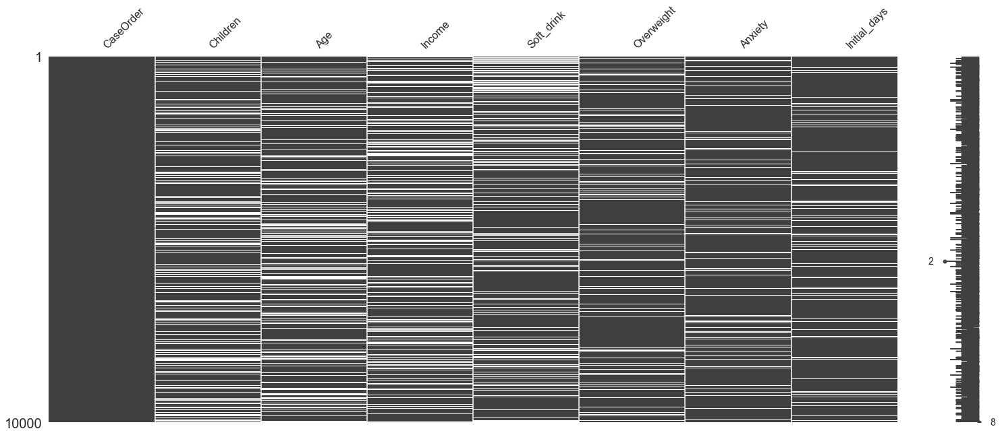

In [213]:
_ = msno.matrix(missing_df) 

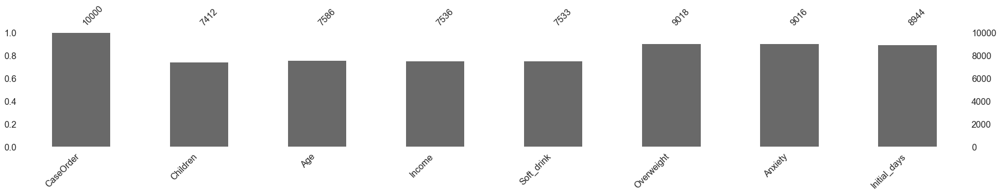

In [218]:
_ = msno.bar(missing_df, figsize=(25, 5))

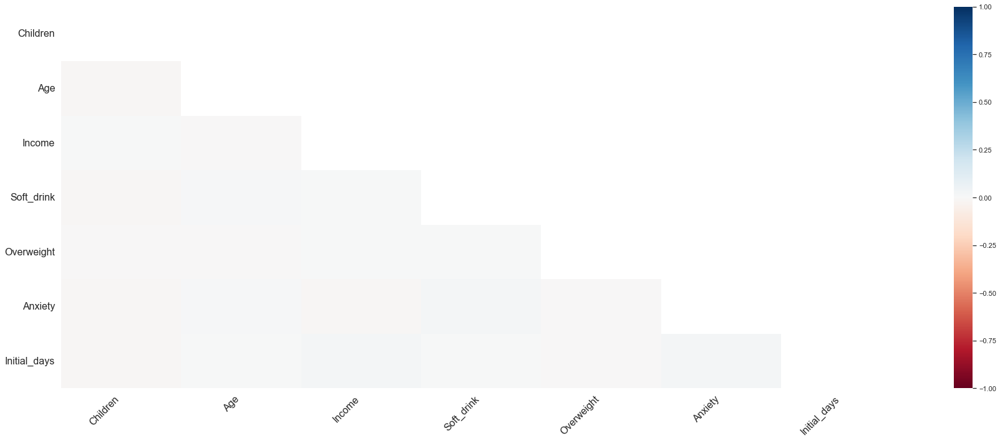

In [219]:
_ = msno.heatmap(missing_df, figsize=(25,10))

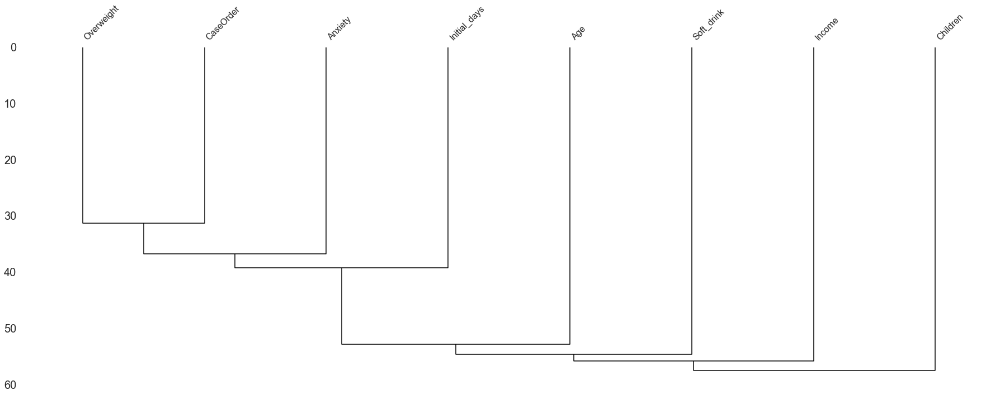

In [220]:
# shows the hierarchical relationship between objects
_ = msno.dendrogram(missing_df, orientation='bottom', figsize=(25,10))

### Detect Outliers

#### Z-Scores

- Write the code for calculating the zscore
    - df[‘NewColumnForZScores']=stats.zscore(df[‘columnname’])
- Write Code to display the calculated z score and the values
    - df[[‘Columnname’,’Columnforzscore']].head
- Use visualizations to examine the outliers (based upon z score). You can also find outliers by using the query() function, which identifies rows that meet a particular condition.


In [41]:
def get_zscore_cols(df):
    numeric_df = df.select_dtypes(include=['int64', 'float64']).apply(pd.to_numeric)
    z_score_df = np.abs(stats.zscore(numeric_df, nan_policy='omit')) > 3
    
    outlier_df = z_score_df.sum()
    outlier_counts_df = outlier_df[outlier_df > 0]

    return outlier_counts_df.index

# numerical columns with notable outliers
ignored_outlier_cols = ['Lat', 'Lng', 'Population', 'Age', 'Income', 'TotalCharge', 'Additional_charges', 'Doc_visits']

# store the relevant zscore columns
z_score_cols = list(set(get_zscore_cols(df)) - set(ignored_outlier_cols))
# list(set(get_zscore_cols(df)) )

In [42]:
print("cols", z_score_cols)

zscore_df = df[z_score_cols].copy()

for col in z_score_cols:
    zscore_df[f"{col}_zscore"] = stats.zscore(df[col], nan_policy='omit')
    # print values where their absolute values exceeds a z-score of > 3
    zscore_df.loc[abs(zscore_df[f"{col}_zscore"]) > 3, [col, f"{col}_zscore"]]

cols ['VitD_levels', 'VitD_supp', 'Item7', 'Item1', 'Item5', 'Children', 'Full_meals_eaten', 'Item3', 'Item4', 'Item8', 'Item6', 'Item2']


#### Boxplots

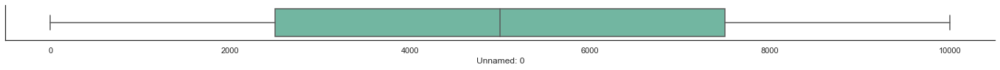

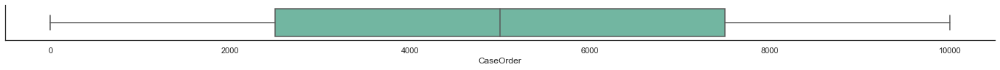

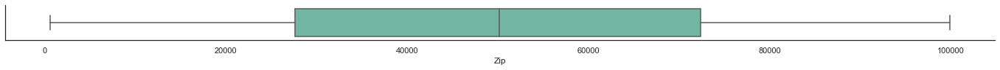

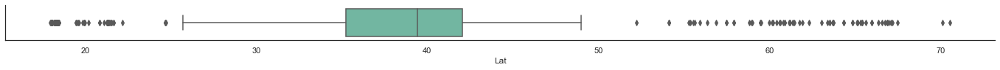

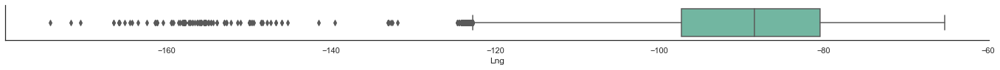

...

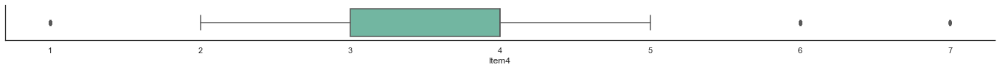

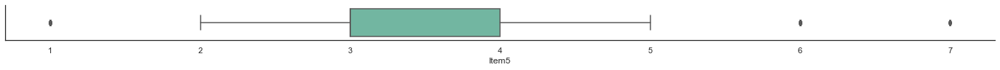

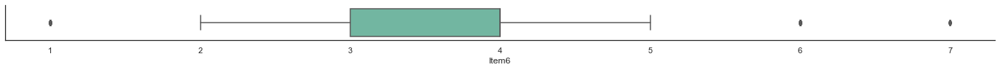

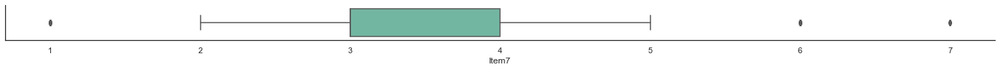

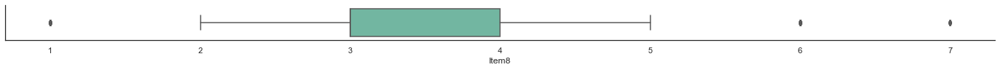

In [221]:
# create a histogram for numerical columns
def create_boxplots(df):
    for col in df.select_dtypes(include=['int64', 'float64']).columns:
        fig = plt.figure(figsize =(19, 1.5))
        _ = sns.boxplot(x=col, data=df, labels=[col], orient="h")
        plt.show()
        

create_boxplots(df)

# display boxplots with known and relevant outliers
# create_boxplots(df[z_score_cols])

#### Histograms

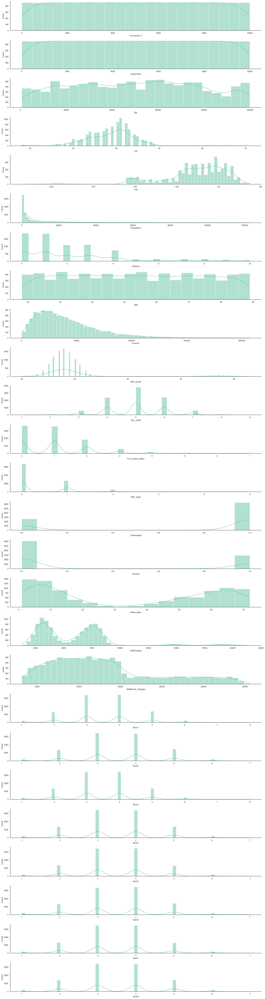

In [327]:
def create_histograms(df):
    numeric_cols = df.select_dtypes(include=['int64', 'float64']).columns
    
    fig, axes = plt.subplots(len(numeric_cols), 1, figsize=(20, 75))

    # create a histogram for numerical columns
    rounded_df = df.round()
    for ax, col in zip(axes, numeric_cols):
        _ = sns.histplot(data=rounded_df, x=col, ax=ax, kde=True)
        
    plt.show()
    
create_histograms(df)        

### Re-Expression Categories

In [45]:
# convert categorical string values to category data type

# convert "Soft_drink" nan's to 'No'
df.loc[df["Soft_drink"].isna(), "Soft_drink"] = "No"

# convert "Overweight" float64's to Yes/No bools
df["Overweight"] = df["Overweight"].map({np.nan: 'No', 0: 'No', 1: 'Yes'})

# validate a value exists for each row
assert len(df["Soft_drink"].isna().index) == len(df.index)

# categorical columns and potential categorical columns
ctg_cols = ["Area", "Timezone", "Employment", "Education",  "Marital", "Gender", "ReAdmis", "Soft_drink", "Initial_admin", "HighBlood", "Stroke", "Complication_risk", "Overweight", "Arthritis", "Diabetes", "Hyperlipidemia", "BackPain", "Allergic_rhinitis", "Reflux_esophagitis", "Asthma", "Services"]

for col in ctg_cols:
    # print(df[col].unique())
    print(f"--- COLUMN: '{col}' ---")    
    # sort the unique values and print 1 value per line
    # print(*np.sort(df[col].unique()), sep='\n', end="\n\n")

    # convert column to a category
    df = df.astype({col: "category"})

    # confirm the values successfully converted     
    assert df[col].dtype == "category"
    
    # report categorical counts     
    print(df[col].value_counts(), end="\n\n")    
    print()

--- COLUMN: 'Area' ---
Rural       3369
Suburban    3328
Urban       3303
Name: Area, dtype: int64


--- COLUMN: 'Timezone' ---
America/New_York                  3889
America/Chicago                   3771
America/Los_Angeles                937
America/Denver                     612
America/Detroit                    262
America/Indiana/Indianapolis       151
America/Phoenix                    100
America/Boise                       86
America/Anchorage                   50
America/Puerto_Rico                 43
Pacific/Honolulu                    34
America/Menominee                   14
America/Nome                        12
America/Indiana/Vincennes            8
America/Sitka                        6
America/Kentucky/Louisville          6
America/Toronto                      5
America/Indiana/Tell_City            3
America/Indiana/Marengo              3
America/North_Dakota/Beulah          2
America/Indiana/Winamac              1
America/Indiana/Vevay                1
America/North_

### Cleaning text data



In [46]:
df.head()

,Unnamed: 0,CaseOrder,Customer_id,Interaction,UID,City,State,County,Zip,Lat,Lng,Population,Area,Timezone,Job,Children,Age,Education,Employment,Income,Marital,Gender,ReAdmis,VitD_levels,Doc_visits,Full_meals_eaten,VitD_supp,Soft_drink,Initial_admin,HighBlood,Stroke,Complication_risk,Overweight,Arthritis,Diabetes,Hyperlipidemia,BackPain,Anxiety,Allergic_rhinitis,Reflux_esophagitis,Asthma,Services,Initial_days,TotalCharge,Additional_charges,Item1,Item2,Item3,Item4,Item5,Item6,Item7,Item8
0,1,1,C412403,8cd49b13-f45a-4b47-a2bd-173ffa932c2f,3a83ddb66e2ae73798bdf1d705dc0932,Eva,AL,Morgan,35621,34.34960,-86.72508,2951,Suburban,America/Chicago,"Psychologist, sport and exercise",1.0,53.0,"Some College, Less than 1 Year",Full Time,86575.93,Divorced,Male,No,17.802330,6,0,0,No,Emergency Admission,Yes,No,Medium,No,Yes,Yes,No,Yes,1.0,Yes,No,Yes,Blood Work,10.585770,3191.048774,17939.403420,3,3,2,2,4,3,3,4
1,2,2,Z919181,d2450b70-0337-4406-bdbb-bc1037f1734c,176354c5eef714957d486009feabf195,Marianna,FL,Jackson,32446,30.84513,-85.22907,11303,Urban,America/Chicago,Community development worker,3.0,51.0,"Some College, 1 or More Years, No Degree",Full Time,46805.99,Married,Female,No,18.994640,4,2,1,No,Emergency Admission,Yes,No,High,Yes,No,No,No,No,NaN,No,Yes,No,Intravenous,15.129562,4214.905346,17612.998120,3,4,3,4,4,4,3,3
2,3,3,F995323,a2057123-abf5-4a2c-abad-8ffe33512562,e19a0fa00aeda885b8a436757e889bc9,Sioux Falls,SD,Minnehaha,57110,43.54321,-96.63772,17125,Suburban,America/Chicago,Chief Executive Officer,3.0,53.0,"Some College, 1 or More Years, No Degree",Retired,14370.14,Widowed,Female,No,17.415889,4,1,0,No,Elective Admission,Yes,No,Medium,Yes,No,Yes,No,No,NaN,No,No,No,Blood Work,4.772177,2177.586768,17505.192460,2,4,4,4,3,4,3,3
3,4,4,A879973,1dec528d-eb34-4079-adce-0d7a40e82205,cd17d7b6d152cb6f23957346d11c3f07,New Richland,MN,Waseca,56072,43.89744,-93.51479,2162,Suburban,America/Chicago,Early years teacher,0.0,78.0,GED or Alternative Credential,Retired,39741.49,Married,Male,No,17.420079,4,1,0,No,Elective Admission,No,Yes,Medium,No,Yes,No,No,No,NaN,No,Yes,Yes,Blood Work,1.714879,2465.118965,12993.437350,3,5,5,3,4,5,5,5
4,5,5,C544523,5885f56b-d6da-43a3-8760-83583af94266,d2f0425877b10ed6bb381f3e2579424a,West Point,VA,King William,23181,37.59894,-76.88958,5287,Rural,America/New_York,Health promotion specialist,NaN,22.0,Regular High School Diploma,Full Time,1209.56,Widowed,Female,No,16.870524,5,0,2,Yes,Elective Admission,No,No,Low,No,No,No,Yes,No,0.0,Yes,No,No,CT Scan,1.254807,1885.655137,3716.525786,2,1,3,3,5,3,4,3


### Other Data Cleaning

In [47]:
# Verify these columns are the same, if so drop the "Unnamed: 0" column
if df["Unnamed: 0"].equals(df["CaseOrder"]):
    df.drop(columns="Unnamed: 0", axis=1)    

In [48]:
df[df.duplicated(subset=['Customer_id', 'Interaction', 'UID'])]
df[df['Unnamed: 0'] != df['CaseOrder']]

# df.duplicated?

,Unnamed: 0,CaseOrder,Customer_id,Interaction,UID,City,State,County,Zip,Lat,Lng,Population,Area,Timezone,Job,Children,Age,Education,Employment,Income,Marital,Gender,ReAdmis,VitD_levels,Doc_visits,Full_meals_eaten,VitD_supp,Soft_drink,Initial_admin,HighBlood,Stroke,Complication_risk,Overweight,Arthritis,Diabetes,Hyperlipidemia,BackPain,Anxiety,Allergic_rhinitis,Reflux_esophagitis,Asthma,Services,Initial_days,TotalCharge,Additional_charges,Item1,Item2,Item3,Item4,Item5,Item6,Item7,Item8


## C2: Justification of Approach
Explain the plan for cleaning the data by doing the following:

2.  Justify your approach for assessing the quality of the data, include:

•  characteristics of the data being assessed,

•  the approach used to assess the quality.

## C3: Justification of Tools
Explain the plan for cleaning the data by doing the following:

3.  Justify your selected programming language and any libraries and packages that will support the data-cleaning process.
    - Python
    - Jupyter Notebooks
    - numpy as np
    - numpy
    - pandas
    - matplotlib.pyplot
    - seaborn
    - missingno
    - sklearn
      - accuracy_score, GradientBoostingRegressor, LassoCV, PCA, RandomForestRegressor, RFE, StandardScaler, SVC, train_test_split, VarianceThreshold
    - fuzzywuzzy
        - process
    - fancyimpute
        - KNN, IterativeImputer
    - statsmodels.api 
      

## C4: Provide the Code
Explain the plan for cleaning the data by doing the following:

4.  Provide the code you will use to identify the anomalies in the data.

In [49]:
df = pd.read_csv(filename)

In [50]:
df.dtypes
print("Shape\n", df.shape, end="\n\n")
print("Columns\n", df.columns, end="\n\n")
print("Index\n", df.index, end="\n\n")
df.info()

Shape
 (10000, 53)

Columns
 Index(['Unnamed: 0', 'CaseOrder', 'Customer_id', 'Interaction', 'UID', 'City',
       'State', 'County', 'Zip', 'Lat', 'Lng', 'Population', 'Area',
       'Timezone', 'Job', 'Children', 'Age', 'Education', 'Employment',
       'Income', 'Marital', 'Gender', 'ReAdmis', 'VitD_levels', 'Doc_visits',
       'Full_meals_eaten', 'VitD_supp', 'Soft_drink', 'Initial_admin',
       'HighBlood', 'Stroke', 'Complication_risk', 'Overweight', 'Arthritis',
       'Diabetes', 'Hyperlipidemia', 'BackPain', 'Anxiety',
       'Allergic_rhinitis', 'Reflux_esophagitis', 'Asthma', 'Services',
       'Initial_days', 'TotalCharge', 'Additional_charges', 'Item1', 'Item2',
       'Item3', 'Item4', 'Item5', 'Item6', 'Item7', 'Item8'],
      dtype='object')

Index
 RangeIndex(start=0, stop=10000, step=1)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 53 columns):
 #   Column              Non-Null Count  Dtype  
---  ------             

In [51]:
df.describe()

,Unnamed: 0,CaseOrder,Zip,Lat,Lng,Population,Children,Age,Income,VitD_levels,Doc_visits,Full_meals_eaten,VitD_supp,Overweight,Anxiety,Initial_days,TotalCharge,Additional_charges,Item1,Item2,Item3,Item4,Item5,Item6,Item7,Item8
count,10000.00000,10000.00000,10000.000000,10000.000000,10000.000000,10000.000000,7412.000000,7586.000000,7536.000000,10000.000000,10000.000000,10000.000000,10000.000000,9018.000000,9016.000000,8944.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000
mean,5000.50000,5000.50000,50159.323900,38.751099,-91.243080,9965.253800,2.098219,53.295676,40484.438268,19.412675,5.012200,1.001400,0.398900,0.709137,0.322316,34.432082,5891.538261,12934.528586,3.518800,3.506700,3.511100,3.515100,3.496900,3.522500,3.494000,3.509700
std,2886.89568,2886.89568,27469.588208,5.403085,15.205998,14824.758614,2.155427,20.659182,28664.861050,6.723277,1.045734,1.008117,0.628505,0.454186,0.467389,26.287050,3377.558136,6542.601544,1.031966,1.034825,1.032755,1.036282,1.030192,1.032376,1.021405,1.042312
min,1.00000,1.00000,610.000000,17.967190,-174.209690,0.000000,0.000000,18.000000,154.080000,9.519012,1.000000,0.000000,0.000000,0.000000,0.000000,1.001981,1256.751699,3125.702716,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,2500.75000,2500.75000,27592.000000,35.255120,-97.352982,694.750000,0.000000,35.000000,19450.792500,16.513171,4.000000,0.000000,0.000000,0.000000,0.000000,7.911709,3253.239465,7986.487642,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000
50%,5000.50000,5000.50000,50207.000000,39.419355,-88.397230,2769.000000,1.000000,53.000000,33942.280000,18.080560,5.000000,1.000000,0.000000,1.000000,0.000000,34.446941,5852.250564,11573.979365,4.000000,3.000000,4.000000,4.000000,3.000000,4.000000,3.000000,3.000000
75%,7500.25000,7500.25000,72411.750000,42.044175,-80.438050,13945.000000,3.000000,71.000000,54075.235000,19.789740,6.000000,2.000000,1.000000,1.000000,1.000000,61.124654,7614.989701,15626.491033,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000
max,10000.00000,10000.00000,99929.000000,70.560990,-65.290170,122814.000000,10.000000,89.000000,207249.130000,53.019124,9.000000,7.000000,5.000000,1.000000,1.000000,71.981486,21524.224210,30566.073130,8.000000,7.000000,8.000000,7.000000,7.000000,7.000000,7.000000,7.000000


In [52]:
df.head(1)

,Unnamed: 0,CaseOrder,Customer_id,Interaction,UID,City,State,County,Zip,Lat,Lng,Population,Area,Timezone,Job,Children,Age,Education,Employment,Income,Marital,Gender,ReAdmis,VitD_levels,Doc_visits,Full_meals_eaten,VitD_supp,Soft_drink,Initial_admin,HighBlood,Stroke,Complication_risk,Overweight,Arthritis,Diabetes,Hyperlipidemia,BackPain,Anxiety,Allergic_rhinitis,Reflux_esophagitis,Asthma,Services,Initial_days,TotalCharge,Additional_charges,Item1,Item2,Item3,Item4,Item5,Item6,Item7,Item8
0,1,1,C412403,8cd49b13-f45a-4b47-a2bd-173ffa932c2f,3a83ddb66e2ae73798bdf1d705dc0932,Eva,AL,Morgan,35621,34.3496,-86.72508,2951,Suburban,America/Chicago,"Psychologist, sport and exercise",1.0,53.0,"Some College, Less than 1 Year",Full Time,86575.93,Divorced,Male,No,17.80233,6,0,0,NaN,Emergency Admission,Yes,No,Medium,0.0,Yes,Yes,No,Yes,1.0,Yes,No,Yes,Blood Work,10.58577,3191.048774,17939.40342,3,3,2,2,4,3,3,4


In [169]:
missing  = df.isnull().sum()
pct_missing = (missing[missing > 0] / len(df.index) * 100).sort_values(ascending=False, axis=0)
pct_missing


# get column names for any columns with missing values
# df.columns[df.isnull().any()]

Children        25.88
Soft_drink      24.67
Income          24.64
Age             24.14
Initial_days    10.56
Anxiety          9.84
Overweight       9.82
dtype: float64

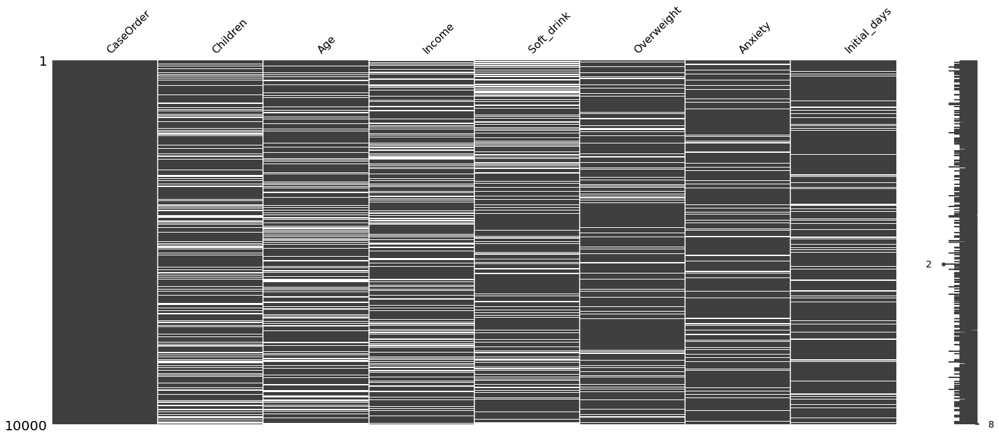

Signature:
msno.matrix(
    df,
    filter=None,
    n=0,
    p=0,
    sort=None,
    figsize=(25, 10),
    width_ratios=(15, 1),
    color=(0.25, 0.25, 0.25),
    fontsize=16,
    labels=None,
    sparkline=True,
    inline=False,
    freq=None,
    ax=None,
)
Docstring:
A matrix visualization of the nullity of the given DataFrame.

:param df: The `DataFrame` being mapped.
:param filter: The filter to apply to the heatmap. Should be one of "top", "bottom", or None (default).
:param n: The max number of columns to include in the filtered DataFrame.
:param p: The max percentage fill of the columns in the filtered DataFrame.
:param sort: The row sort order to apply. Can be "ascending", "descending", or None.
:param figsize: The size of the figure to display.
:param fontsize: The figure's font size. Default to 16.
:param labels: Whether or not to display the column names. Defaults to the underlying data labels when there are
50 columns or less, and no labels when there are more than 50 co

In [168]:
missing_df = df[['CaseOrder'] + list(df.columns[df.isnull().any()])].sort_values('CaseOrder')
_ = msno.matrix(missing_df, figsize=(25,10)) 
msno.matrix?
# msno.bar(missing_df)
# msno.heatmap(missing_df)

/var/folders/dl/vq577pv129dffsrtm__9bd380000gn/T/ipykernel_13665/4179717664.py:10: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  df.hist(ax = ax)


array([[<AxesSubplot:title={'center':'Unnamed: 0'}>,
        <AxesSubplot:title={'center':'CaseOrder'}>,
        <AxesSubplot:title={'center':'Zip'}>,
        <AxesSubplot:title={'center':'Lat'}>,
        <AxesSubplot:title={'center':'Lng'}>],
       [<AxesSubplot:title={'center':'Population'}>,
        <AxesSubplot:title={'center':'Children'}>,
        <AxesSubplot:title={'center':'Age'}>,
        <AxesSubplot:title={'center':'Income'}>,
        <AxesSubplot:title={'center':'VitD_levels'}>],
       [<AxesSubplot:title={'center':'Doc_visits'}>,
        <AxesSubplot:title={'center':'Full_meals_eaten'}>,
        <AxesSubplot:title={'center':'VitD_supp'}>,
        <AxesSubplot:title={'center':'Overweight'}>,
        <AxesSubplot:title={'center':'Anxiety'}>],
       [<AxesSubplot:title={'center':'Initial_days'}>,
        <AxesSubplot:title={'center':'TotalCharge'}>,
        <AxesSubplot:title={'center':'Additional_charges'}>,
        <AxesSubplot:title={'center':'Item1'}>,
        <AxesSub

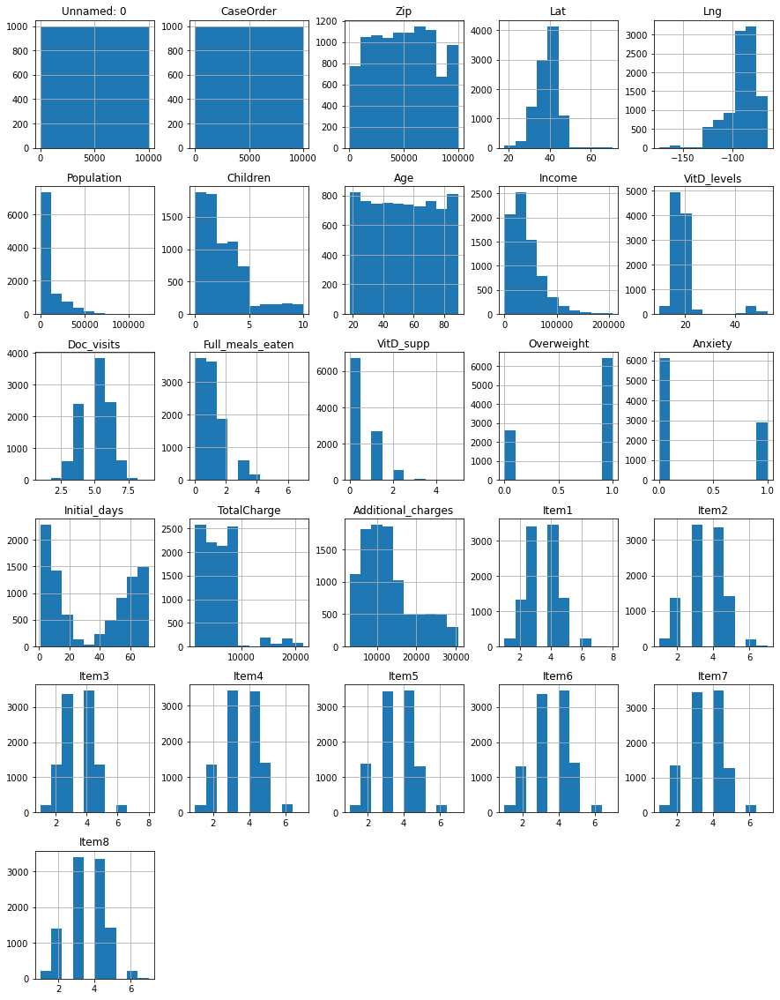

Signature: fig.gca(**kwargs)
Docstring:
Get the current Axes, creating one if necessary.

The following kwargs are supported for ensuring the returned Axes
adheres to the given projection etc., and for Axes creation if
the active Axes does not exist:

Properties:
    adjustable: {'box', 'datalim'}
    agg_filter: a filter function, which takes a (m, n, 3) float array and a dpi value, and returns a (m, n, 3) array
    alpha: scalar or None
    anchor: 2-tuple of floats or {'C', 'SW', 'S', 'SE', ...}
    animated: bool
    aspect: {'auto', 'equal'} or float
    autoscale_on: bool
    autoscalex_on: bool
    autoscaley_on: bool
    axes_locator: Callable[[Axes, Renderer], Bbox]
    axisbelow: bool or 'line'
    box_aspect: float or None
    clip_box: `.Bbox`
    clip_on: bool
    clip_path: Patch or (Path, Transform) or None
    contains: unknown
    facecolor or fc: color
    figure: `.Figure`
    frame_on: bool
    gid: str
    in_layout: bool
    label: object
    navigate: bool
    na

In [55]:
# df.hist(figsize=(75, 75))
# plt.tight_layout()
# plt.show()

# find cols with null values

fig = plt.figure(figsize = (15,20))
ax = fig.gca()
fig.gca?
df.hist(ax = ax)

In [56]:
# DataFrame.plot.bar(x=None, y=None, **kwargs)
# df.plot.bar(index=1)
# df
# df.plot.bar(rot=0)
# df.hist(ax = ax)

In [57]:
df['Customer_id'].str.len().unique()
# df[df['Customer_id'].str.len() == 6]
df['State'].str.len().unique()
df['UID'].str.len().unique()
df['Interaction'].str.len().unique()
df['Zip'].astype(str).str.len().unique()
df[df['Zip'].astype(str).str.len() == 3]

df['Lat'].astype(str).str.len().unique()
df['Lng'].astype(str).str.len().unique()
df[df['Lng'].astype(str).str.len() == 10]

,Unnamed: 0,CaseOrder,Customer_id,Interaction,UID,City,State,County,Zip,Lat,Lng,Population,Area,Timezone,Job,Children,Age,Education,Employment,Income,Marital,Gender,ReAdmis,VitD_levels,Doc_visits,Full_meals_eaten,VitD_supp,Soft_drink,Initial_admin,HighBlood,Stroke,Complication_risk,Overweight,Arthritis,Diabetes,Hyperlipidemia,BackPain,Anxiety,Allergic_rhinitis,Reflux_esophagitis,Asthma,Services,Initial_days,TotalCharge,Additional_charges,Item1,Item2,Item3,Item4,Item5,Item6,Item7,Item8
16,17,17,O377757,7faf0261-bc66-489a-a8ba-fec333485254,728333940561457a9feba1e1dc763258,Blythe,CA,Riverside,92225,33.74647,-114.66793,22149,Suburban,America/Los_Angeles,Fast food restaurant manager,10.0,44.0,"Some College, 1 or More Years, No Degree",Full Time,24250.51,Divorced,Male,No,17.163216,5,1,1,No,Emergency Admission,No,No,Medium,1.0,No,No,No,No,0.0,No,No,No,Intravenous,7.038432,2938.953493,8157.752223,5,4,5,2,4,3,4,3
22,23,23,S147737,7b553658-a4e2-48f0-a81b-d70d2c1b6c02,34898a0f4109efc1b2415ca01ce450de,Big Springs,NE,Deuel,69122,41.13007,-102.10258,729,Urban,America/Denver,"Restaurant manager, fast food",NaN,31.0,Professional School Degree,Full Time,57621.66,Widowed,Female,No,25.514635,5,0,2,No,Emergency Admission,Yes,No,High,NaN,Yes,No,Yes,No,0.0,No,Yes,No,Intravenous,3.798955,3810.394918,11112.139460,4,5,5,3,5,6,3,5
50,51,51,D279230,02ac341c-33af-4b40-ad8a-59ff6cfe3d2e,83d1f0b9448e9e95b1796eb14c6f3c51,Kenmare,ND,Ward,58746,48.71825,-102.08516,1348,Rural,America/Chicago,Television floor manager,0.0,33.0,Master's Degree,Full Time,101159.20,Divorced,Female,No,16.354085,6,2,0,No,Emergency Admission,No,Yes,Low,0.0,No,No,Yes,No,0.0,Yes,Yes,Yes,Blood Work,15.586494,3345.350713,6501.407030,3,3,4,3,4,3,4,4
65,66,66,Q660046,3ade4df3-2168-40df-9929-66b232d3a8a3,e81f2ce7a34173a2e91ea2914648290c,Savoonga,AK,Nome,99769,63.67959,-170.48517,921,Urban,America/Nome,Cartographer,7.0,NaN,Nursery School to 8th Grade,Full Time,50129.65,Never Married,Female,No,20.598610,3,1,0,Yes,Emergency Admission,Yes,Yes,Medium,1.0,No,No,Yes,No,1.0,Yes,No,Yes,Blood Work,3.603021,3886.789806,19880.142030,5,3,4,3,4,4,3,3
66,67,67,N397769,fe4d1b93-ef78-4943-b091-ff77c3f7245c,09c786257076d4179964644a8acb734b,Albuquerque,NM,Bernalillo,87102,35.08098,-106.64664,19912,Urban,America/Denver,Company secretary,1.0,NaN,Bachelor's Degree,Full Time,26005.20,Never Married,Male,No,18.171853,3,1,1,No,Elective Admission,No,No,Medium,0.0,Yes,No,No,No,0.0,No,No,No,Blood Work,8.617860,2550.804490,13890.439870,5,5,4,2,5,4,3,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9969,9970,9970,F450521,5a941aca-c2b4-4cc5-b7c3-36d0e9500e08,5ffada138b0fc6863e16d2fa75d5b8ee,Blue Gap,AZ,Apache,86520,36.11051,-109.93601,1689,Suburban,America/Denver,Publishing rights manager,2.0,28.0,Nursery School to 8th Grade,Full Time,45708.50,Widowed,Female,Yes,16.430818,3,2,0,Yes,Elective Admission,No,No,High,1.0,No,No,Yes,Yes,0.0,No,Yes,No,Blood Work,NaN,7352.547820,5259.739033,4,3,4,4,4,6,5,5
9971,9972,9972,K874758,56095044-286a-4d65-8347-bfd5680a1fa9,c313d637cdbbfd6d3e27834ab8d42c1d,Stratford,CA,Kings,93266,36.15725,-119.86374,1406,Suburban,America/Los_Angeles,"Investment banker, corporate",0.0,58.0,Bachelor's Degree,Student,NaN,Widowed,Female,No,21.448394,6,0,0,NaN,Observation Admission,No,No,Medium,1.0,No,No,No,No,0.0,No,No,No,Blood Work,53.817823,6842.784074,9605.539227,4,4,3,4,4,5,2,4
9983,9984,9984,X601497,3eb0fcfd-a4d7-4c16-853f-9bdeecd2e5e4,2066519cb69de7fd3ab99ae1d95e00bc,Sterling City,TX,Sterling,76951,31.81488,-101.04641,1141,Suburban,America/Chicago,Further education lecturer,0.0,38.0,"Some College, 1 or More Years, No Degree",Student,10861.50,Separated,Female,Yes,14.868820,5,1,0,No,Observation Admission,Yes,Yes,Low,1.0,No,No,Yes,No,0.0,No,Yes,No,Blood Work,66.307341,6658.934767,12498.636960,2,2,3,3,3,3,2,3
9987,9988,9988,B175022,dca49a93-0d

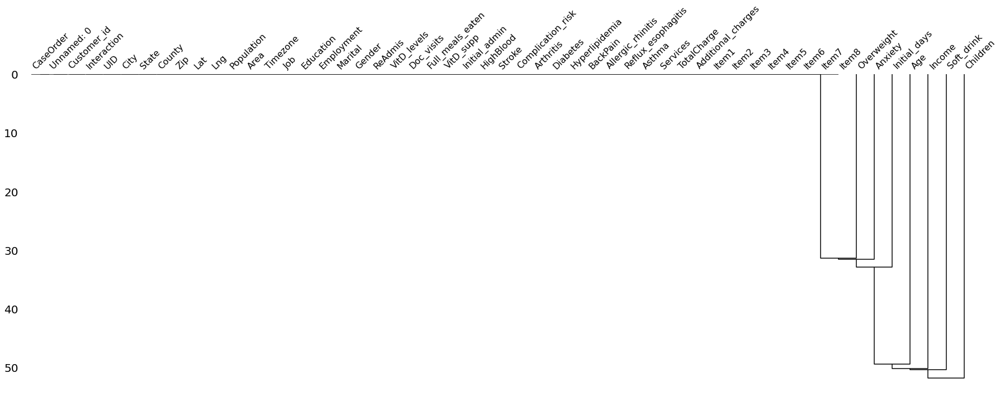

In [59]:
# Verify these columns are the same, if so drop the "Unnamed: 0" column
df[df["Unnamed: 0"] != df["CaseOrder"]]
# df.drop("Unnamed: 0", 1)

,Unnamed: 0,CaseOrder,Customer_id,Interaction,UID,City,State,County,Zip,Lat,Lng,Population,Area,Timezone,Job,Children,Age,Education,Employment,Income,Marital,Gender,ReAdmis,VitD_levels,Doc_visits,Full_meals_eaten,VitD_supp,Soft_drink,Initial_admin,HighBlood,Stroke,Complication_risk,Overweight,Arthritis,Diabetes,Hyperlipidemia,BackPain,Anxiety,Allergic_rhinitis,Reflux_esophagitis,Asthma,Services,Initial_days,TotalCharge,Additional_charges,Item1,Item2,Item3,Item4,Item5,Item6,Item7,Item8


In [60]:
df[["Unnamed: 0", "CaseOrder"]].describe()

,Unnamed: 0,CaseOrder
count,10000.00000,10000.00000
mean,5000.50000,5000.50000
std,2886.89568,2886.89568
min,1.00000,1.00000
25%,2500.75000,2500.75000
50%,5000.50000,5000.50000
75%,7500.25000,7500.25000
max,10000.00000,10000.00000


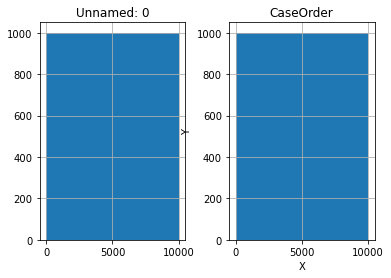

In [61]:
pd.DataFrame.hist(df[["Unnamed: 0", "CaseOrder"]])
plt.xlabel("X")
plt.ylabel("Y")
plt.show()

In [62]:
# convert categorical string values to category data type
# df["Employment"] = df["Employment"].astype("category")

df["Soft_drink"].unique() # > [nan, 'No', 'Yes']
# convert "Soft_drink" nan's to 'No'
df.loc[df["Soft_drink"].isna(), "Soft_drink"] = "No"
# validate a value exists for each row
assert len(df["Soft_drink"].isna().index) == len(df.index)

# df[df["Soft_drink"] == np.nan]

for col in ["Employment", "Marital", "Gender", "ReAdmis", "Soft_drink", "Initial_admin", "HighBlood", "Stroke", "Complication_risk", "Arthritis", "Diabetes", "Hyperlipidemia","BackPain", "Allergic_rhinitis", "Reflux_esophagitis", "Asthma", "Services"]:
    print(f"Converting feature '{col}' to 'category' data type")
    # report categorical counts     
    print(df[col].value_counts(), end="\n\n")

    # convert column to a category
    df = df.astype({col: "category"})

    # confirm the values successfully converted     
    assert df[col].dtype == "category"

# df["Soft_drink"].unique()
# df.groupby("Soft_drink").size()

Converting feature 'Employment' to 'category' data type
Full Time     6029
Student       1017
Part Time      991
Unemployed     983
Retired        980
Name: Employment, dtype: int64

Converting feature 'Marital' to 'category' data type
Widowed          2045
Married          2023
Separated        1987
Never Married    1984
Divorced         1961
Name: Marital, dtype: int64

Converting feature 'Gender' to 'category' data type
Female                  5018
Male                    4768
Prefer not to answer     214
Name: Gender, dtype: int64

Converting feature 'ReAdmis' to 'category' data type
No     6331
Yes    3669
Name: ReAdmis, dtype: int64

Converting feature 'Soft_drink' to 'category' data type
No     8056
Yes    1944
Name: Soft_drink, dtype: int64

Converting feature 'Initial_admin' to 'category' data type
Emergency Admission      5060
Elective Admission       2504
Observation Admission    2436
Name: Initial_admin, dtype: int64

Converting feature 'HighBlood' to 'category' data type
N

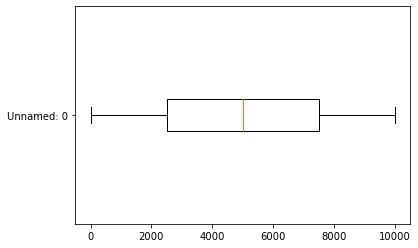

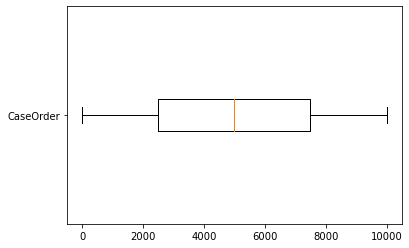

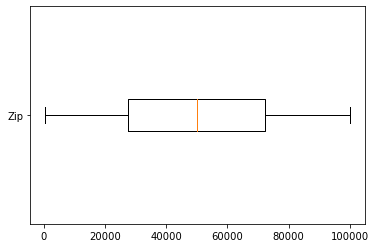

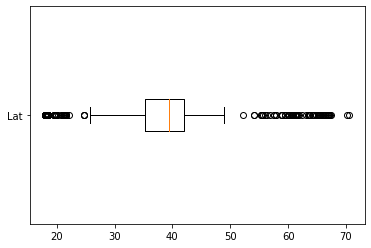

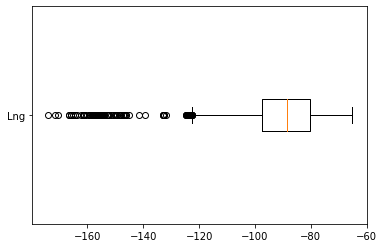

...

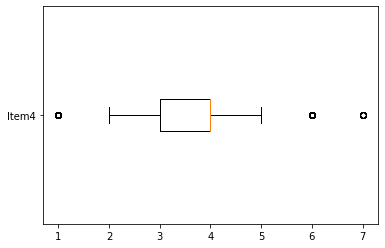

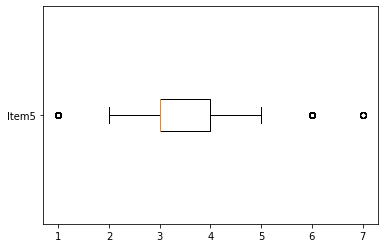

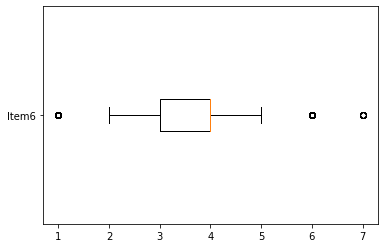

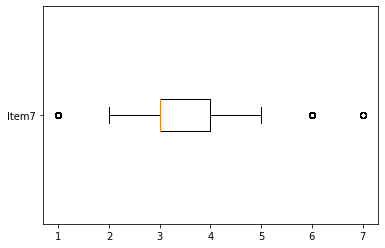

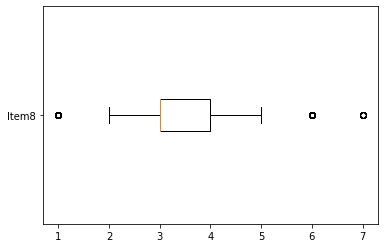

In [63]:
for col in df.select_dtypes(include=['int64', 'float64']).columns:
    plt.boxplot(df[col], labels=[col], vert=False)
    plt.show()

# Part III: Data Cleaning
---

## D1: Cleaning Findings

In [333]:
df = pd.read_csv(filename)
treated_df = df.copy()

### Duplicate Treatment

In [65]:
treated_df = treated_df.drop_duplicates(subset=['Customer_id', 'Interaction', 'UID'])
assert treated_df.duplicated(subset=['Customer_id', 'Interaction', 'UID']).sum() == 0

### Missing Value Treatment

In [361]:
null_df = treated_df.isnull().sum()
null_counts_df = null_df[null_df > 0].sort_values(ascending=False)

# store the list of column names with missing values
missing_cols = null_counts_df.index

null_counts_df

Children        2588
Soft_drink      2467
Income          2464
Age             2414
Initial_days    1056
Anxiety          984
Overweight       982
dtype: int64

#### Children Imputation Comps

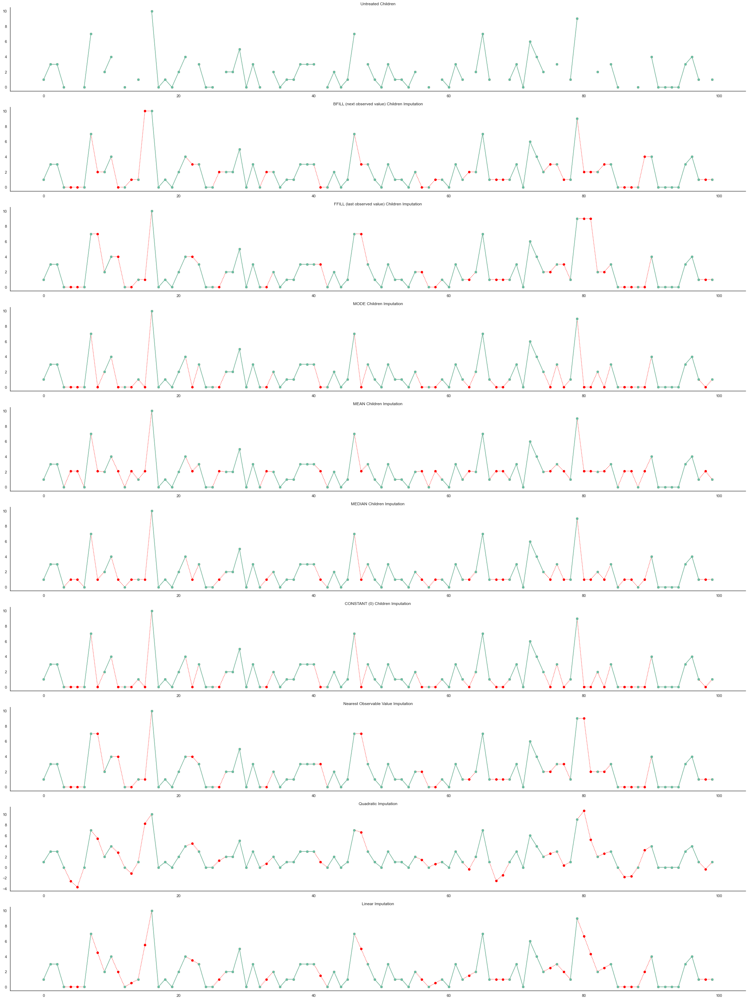

In [362]:
n = 100
col = 'Children'
imp_df = df[col].head(n)

imputations = {
    f'Untreated {col}': imp_df,
    f'BFILL (next observed value) {col} Imputation': imp_df.fillna(method='bfill'),
    f'FFILL (last observed value) {col} Imputation': imp_df.fillna(method='ffill'),    
    f'MODE {col} Imputation': imp_df.fillna(df[col].mode()[0]),
    f'MEAN {col} Imputation': imp_df.fillna(df[col].mean()),
    f'MEDIAN {col} Imputation': imp_df.fillna(df[col].median()),
    f'CONSTANT (0) {col} Imputation': imp_df.fillna(0),
    f'Nearest Observable Value Imputation': imp_df.interpolate(method='nearest'),
    f'Quadratic Imputation': imp_df.interpolate(method='quadratic'),
    f'Linear Imputation': imp_df.interpolate(method='linear'),    
}

fig, axes = plt.subplots(len(imputations), 1, figsize=(30, 40))

for ax, (k, v) in zip(axes, imputations.items()):
    _ = v.plot(title=k, color='red', marker='o', linestyle='dotted', ax=ax)
    _ = df[col].head(n).plot(marker='o', ax=ax)

#### Age Imputation Comps

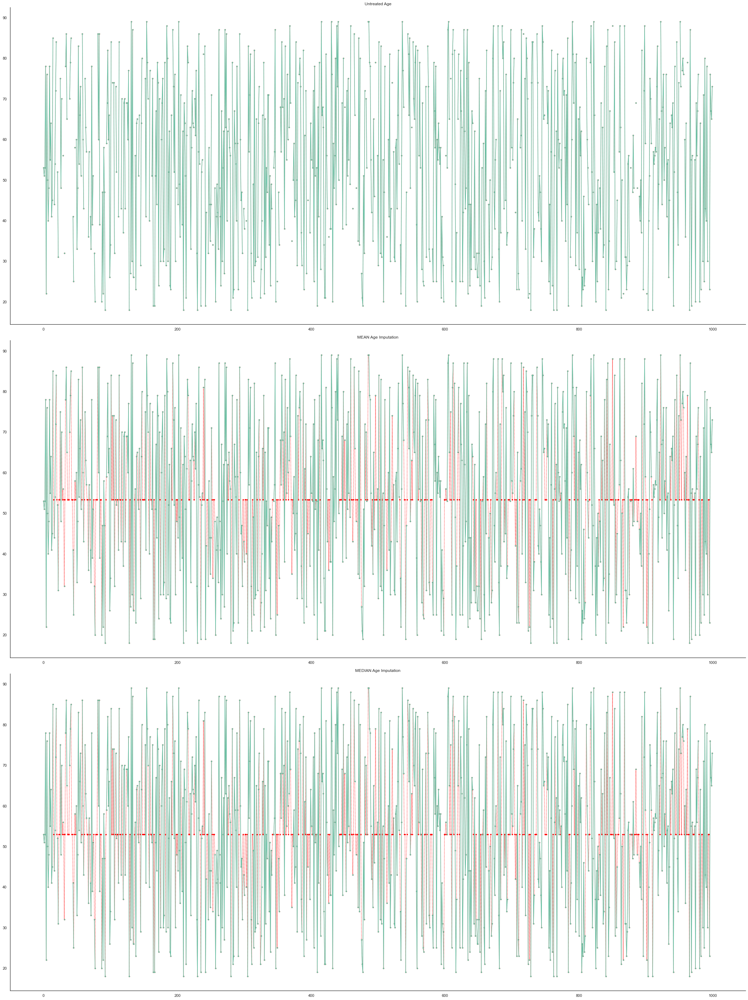

In [363]:
n = 1000
col = 'Age'
imp_df = df[col].head(n)

imputations = {  
    f'Untreated {col}': imp_df,
    f'MEAN {col} Imputation': imp_df.fillna(df[col].mean()),    
    f'MEDIAN {col} Imputation': imp_df.fillna(df[col].median()),
}

fig, axes = plt.subplots(len(imputations), 1, figsize=(30, 40))

for ax, (k, v) in zip(axes, imputations.items()):
    _ = v.plot(title=k, color='red', marker='.', linestyle='dotted', ax=ax)
    _ = df[col].head(n).plot(marker='.', ax=ax)

#### Initial_days Imputation Comps

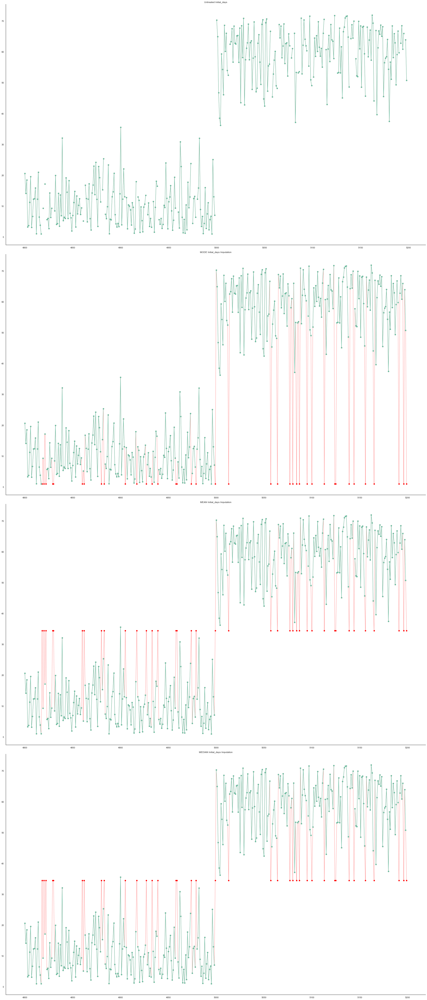

In [364]:
col = 'Initial_days'
rows = range(4800,5200)
imp_df = df[col].loc[rows]

imputations = {  
    f'Untreated {col}': imp_df,
    f'MODE {col} Imputation': imp_df.fillna(df[col].mode()[0]),
    f'MEAN {col} Imputation': imp_df.fillna(df[col].mean()),    
    f'MEDIAN {col} Imputation': imp_df.fillna(df[col].median()),
}

fig, axes = plt.subplots(len(imputations), 1, figsize=(30, 70))

for ax, (k, v) in zip(axes, imputations.items()):
    _ = v.plot(title=k, color='red', marker='o', linestyle='dotted', ax=ax)
    _ = df[col].loc[rows].plot(marker='o', ax=ax)

#### Imputations

In [365]:
# uniform and multimodal distributions (mean)    
for col in ["Age", "Initial_days"]:
    treated_df[col] = df[col].fillna(df[col].mean())
    
# skewed distributions (median)    
for col in ["Income"]: 
    treated_df[col] = df[col].fillna(df[col].median())
    
# binomial distributions (mode)    
for col in ["Anxiety", "Overweight"]:
    treated_df[col] = df[col].fillna(df[col].mode()[0])

# Use Constant Value
treated_df.loc[treated_df["Soft_drink"].isnull(), ["Soft_drink"]] = 'No'
treated_df.loc[treated_df["Children"].isnull(), ["Children"]] = 0

### Verify Missing Value Imputation

In [366]:
nan_df = treated_df.isnull().sum()

if nan_df.sum() != 0:
    raise AssertionError(f"NaN values still exist in the dataset\n{nan_df[nan_df > 0]}")

### Compare Treated and Untreated Data Summaries

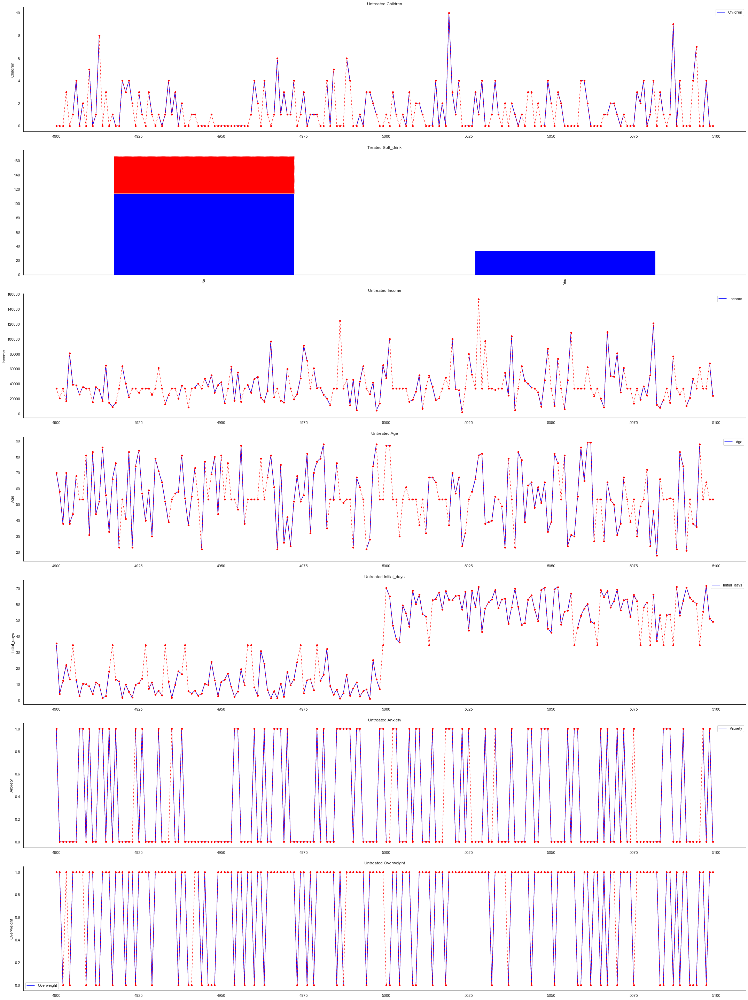

Signature:
sns.lineplot(
    *,
    x=None,
    y=None,
    hue=None,
    size=None,
    style=None,
    data=None,
    palette=None,
    hue_order=None,
    hue_norm=None,
    sizes=None,
    size_order=None,
    size_norm=None,
    dashes=True,
    markers=None,
    style_order=None,
    units=None,
    estimator='mean',
    ci=95,
    n_boot=1000,
    seed=None,
    sort=True,
    err_style='band',
    err_kws=None,
    legend='auto',
    ax=None,
    **kwargs,
)
Docstring:
Draw a line plot with possibility of several semantic groupings.

The relationship between ``x`` and ``y`` can be shown for different subsets
of the data using the ``hue``, ``size``, and ``style`` parameters. These
parameters control what visual semantics are used to identify the different
subsets. It is possible to show up to three dimensions independently by
using all three semantic types, but this style of plot can be hard to
interpret and is often ineffective. Using redundant semantics (i.e. both
``hue`` and 

In [407]:
fig, axes = plt.subplots(len(missing_cols), 1, figsize=(30, 40))
rows = range(4900,5100)

sns.lineplot?

for ax, col in zip(axes, missing_cols):
    try:
        _ = data=df[col].loc[rows].plot(title=f'Untreated {col}', color='blue', ax=ax)
        _ = sns.lineplot(data=treated_df[col].loc[rows], color='red', marker='o', linestyle='dotted', ax=ax)
    except TypeError:
        # display non-numeric data in a bar chart
        _ = treated_df[col].loc[rows].value_counts().plot(title=f'Treated {col}', kind='bar', color='red', linestyle='dotted', ax=ax)
        _ = df[col].loc[rows].value_counts().plot(color='blue', kind='bar', ax=ax)
        pass
        
    # compare Treated and Untreated data descriptions
    pd.DataFrame({f'Untreated {col}': df[col].describe(), f'Treated {col}': treated_df[col].describe()})

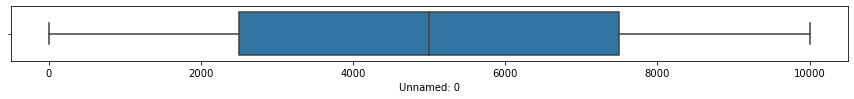

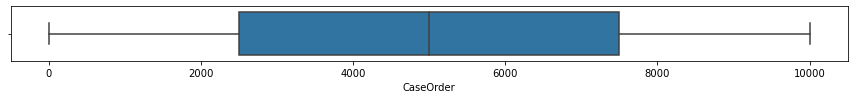

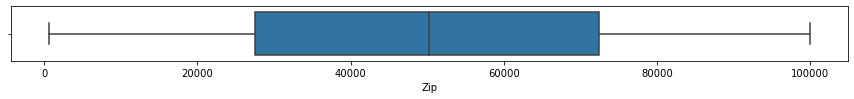

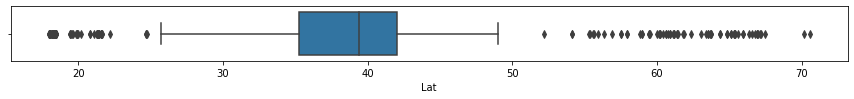

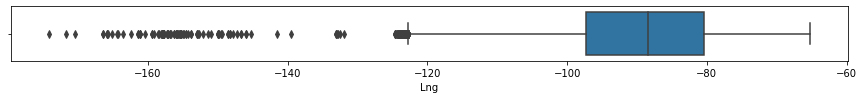

...

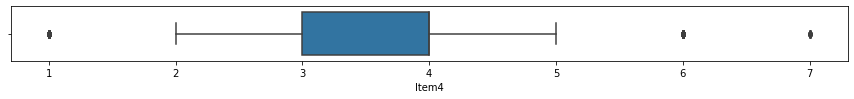

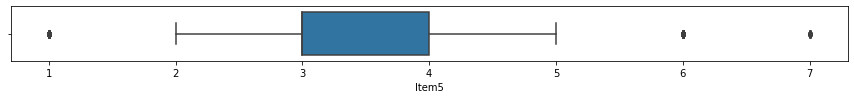

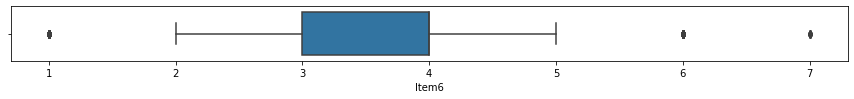

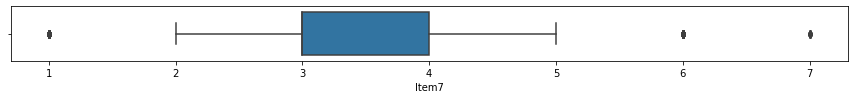

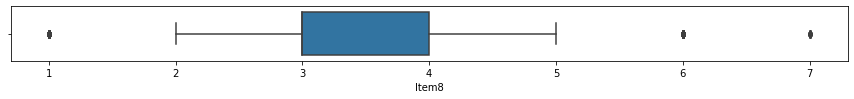

In [73]:
# create_boxplots(df)
create_boxplots(treated_df)

### Outlier Treatment

In [75]:
# numerical columns with notable outliers outliers are allowed on columns not listed here
z_score_cols = ['Children', 'VitD_levels', 'Full_meals_eaten', 'VitD_supp', 'TotalCharge', 'Additional_charges']

treated_df['Children'].value_counts()
# create_boxplots(df[z_score_cols])
# create_histograms(treated_df)    
# create_histograms(treated_df)
# treated_df[['VitD_levels', 'Gender']].round().sort_values(by='VitD_levels').value_counts()

pd.set_option('display.max_rows', None)


# display(treated_df[['VitD_levels', 'Gender', 'Age']].round().groupby(['Gender', 'Age']).agg(statistics).sort_values('VitD_levels'))
# counts()
# ride_unique = ride_dup.groupby('ride_id').agg(statistics).reset_index()


# round().sort_values(by='VitD_levels').value_counts()

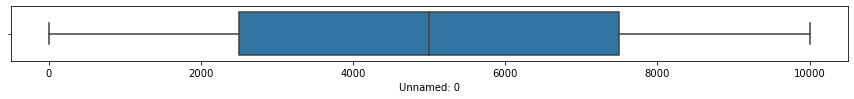

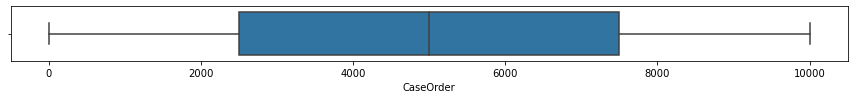

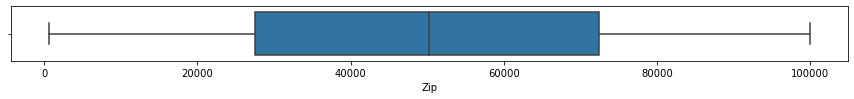

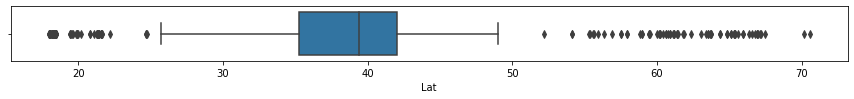

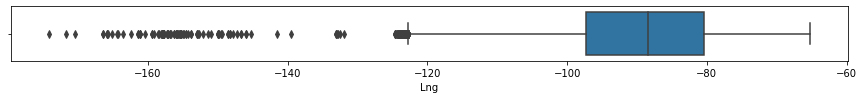

...

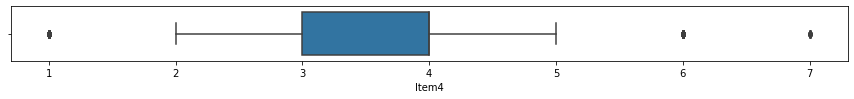

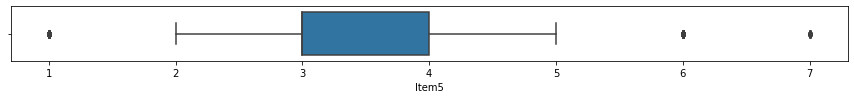

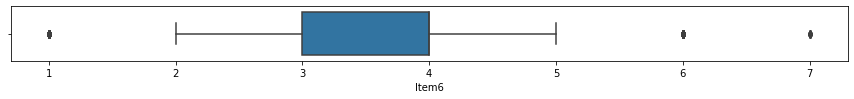

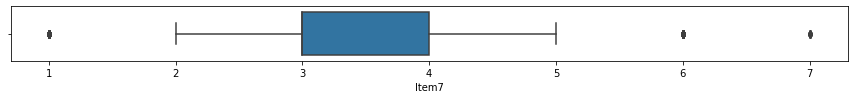

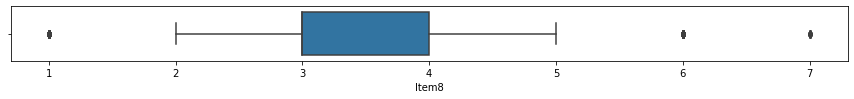

In [76]:
create_boxplots(treated_df)    

#### VitD_levels Outlier Exploration

In [77]:
# pd.set_option('display.max_rows', None)
# determine what correlation exists between Gender and VitD_levels
pd.DataFrame(treated_df[treated_df['Gender'] == 'Prefer not to answer'][['VitD_levels', 'Gender', 'Age']].round().sort_values(ascending=False, by=['VitD_levels', 'Age'])).head(10)

# determine what the average VitD_levels are by Gender and Age
treated_df[['VitD_levels', 'Gender', 'Age']].round().groupby(['Gender', 'Age']).agg({'VitD_levels': 'mean'}).sort_values('VitD_levels')

# determine what correlation exists between Gender and VitD_levels
vitd_df = df.copy()
vitd_df['Gender'] = df['Gender'].map({'Prefer not to answer': 0, 'Male': 1, 'Female': 2})
vitd_df.corr()['VitD_levels'].sort_values(ascending=False)

VitD_levels           1.000000
TotalCharge           0.728268
Age                   0.020097
Additional_charges    0.016369
Anxiety               0.014083
Item4                 0.012935
VitD_supp             0.010495
Full_meals_eaten      0.008691
Item6                 0.007654
Item8                 0.003871
Population            0.002510
Item7                 0.001861
Doc_visits            0.001482
Income                0.000162
Lng                  -0.000263
Initial_days         -0.001095
Unnamed: 0           -0.001661
CaseOrder            -0.001661
Children             -0.002041
Item1                -0.003945
Lat                  -0.004274
Overweight           -0.007684
Zip                  -0.008293
Gender               -0.011300
Item5                -0.011919
Item3                -0.012760
Item2                -0.017552
Name: VitD_levels, dtype: float64

#### VitD_levels Outlier Treatment

#### Children Outlier Exploration

range(int(df[col].min()), int(df[col].max())) range(0, 10)


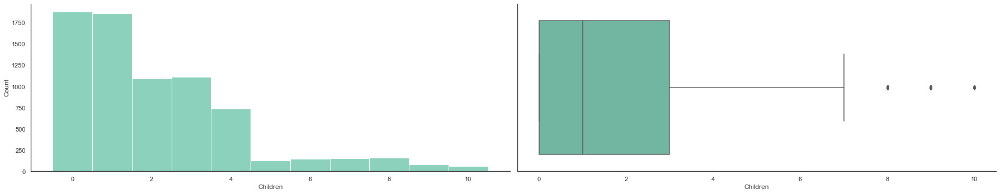

In [526]:
def create_hist_and_boxplots(df, col):
    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(25, 5))
    sns.histplot(data=df, x=col, ax=axes[0], binwidth=1, discrete=True)
    sns.boxplot(data=df, x=col, ax=axes[1])
    
create_hist_and_boxplots(df, "Children")

#### Children Outlier Treatment

range(int(df[col].min()), int(df[col].max())) range(0, 8)


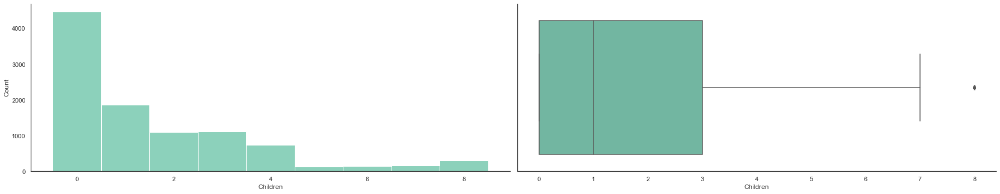

In [529]:
col = "Children"

children_z_df = abs(stats.zscore(df[col], nan_policy="omit"))
pd.DataFrame(df[children_z_df > 3][col].value_counts())

treated_df[col] = treated_df[col].astype("int")

# store maximum number of children that is a nonoutlier
max_num_children = df[children_z_df < 3][col].max()

# set the Children outliers to the max nonoutlier
treated_df.loc[treated_df[col] > max_num_children, col] = max_num_children

assert treated_df[col].max() == max_num_children

create_hist_and_boxplots(treated_df, col)

#### Full_meals_eaten Outlier Exploration

range(int(df[col].min()), int(df[col].max())) range(0, 7)


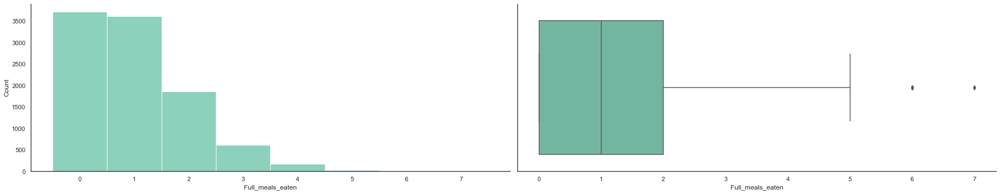

In [528]:
create_hist_and_boxplots(df, "Full_meals_eaten")

#### Full_meals_eaten Outlier Treatment

In [539]:
col = "Full_meals_eaten"

meals_z_df = abs(stats.zscore(df[col], nan_policy="omit"))
pd.DataFrame(df[meals_z_df > 3][col].value_counts())

treated_df[col] = treated_df[col].astype("int")

# store maximum number of children that is a nonoutlier
# store maximum number of children that is a nonoutlier
max_num_meals = df[children_z_df < 3][col].max()
med_num_meals = df[col].median()

# set the meals eaten outliers to the median value
treated_df.loc[meals_z_df > 3, col] = med_num_meals

assert treated_df[col].max() <= max_num_meals

range(int(df[col].min()), int(df[col].max())) range(0, 4)


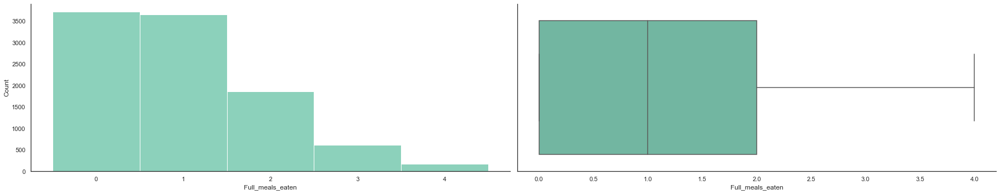

In [534]:
create_hist_and_boxplots(treated_df, "Full_meals_eaten")

In [145]:
from sklearn.impute import SimpleImputer
children_mean = df["Children"].copy(deep=True)
mean_imp = SimpleImputer(strategy='mean')
# children_mean.iloc[:, :] = 
# mean_imp.fit_transform(children_mean)

x['foo'] = pd.DataFrame(mean_imp.fit_transform(children_mean))
x['foo'].unique()

data['age'] = mean_imp.transform(df["Children"]).ravel()
imputer=SimpleImputer(missing_values=np.nan,strategy='mean')
imputer=imputer.fit(X[:,1:3])
X[:,1:3]=imputer.fit)transform(X[:,1:3])

# imr = Imputer(missing_values='NaN', strategy='median', axis=0)
# imr = imr.fit(data[['age']])
# data['age'] = imr.transform(data[['age']]).ravel()
# type(pd.DataFrame(children_mean))


SyntaxError: unmatched ')' (2310354959.py, line 13)

In [170]:
z_score_cols = ['Children', 'VitD_levels', 'Full_meals_eaten', 'VitD_supp']
diabetes_mean = df[z_score_cols].copy(deep=True)
mean_imputer = SimpleImputer(strategy='mean') 
diabetes_mean.iloc[:, :] = mean_imputer.fit_transform(diabetes_mean)
diabetes_mean

,Children,VitD_levels,Full_meals_eaten,VitD_supp
0,1.0,17.802330,0.0,0.0
1,3.0,18.994640,2.0,1.0
2,3.0,17.415889,1.0,0.0
3,0.0,17.420079,1.0,0.0
4,0.0,0.000000,0.0,0.0
...,...,...,...,...
9995,0.0,0.000000,0.0,0.0
9996,4.0,18.451601,0.0,0.0
9997,3.0,15.752751,2.0,0.0
9998,3.0,21.956305,2.0,1.0


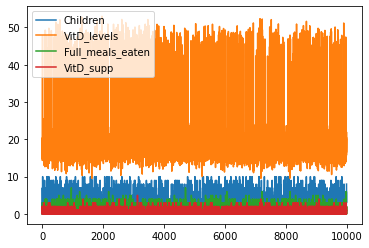

In [836]:
diabetes_median = df[z_score_cols].copy(deep=True)
mean_imputer = SimpleImputer(strategy='mean') 
diabetes_median.iloc[:, :] = mean_imputer.fit_transform(diabetes_median)
_ = diabetes_median.plot()

DF Mean Imputation


<AxesSubplot:title={'center':'Mean Imputation'}, xlabel='Full_meals_eaten', ylabel='Full_meals_eaten'>

DF Median Imputation


<AxesSubplot:title={'center':'Median Imputation'}, xlabel='Full_meals_eaten', ylabel='Full_meals_eaten'>

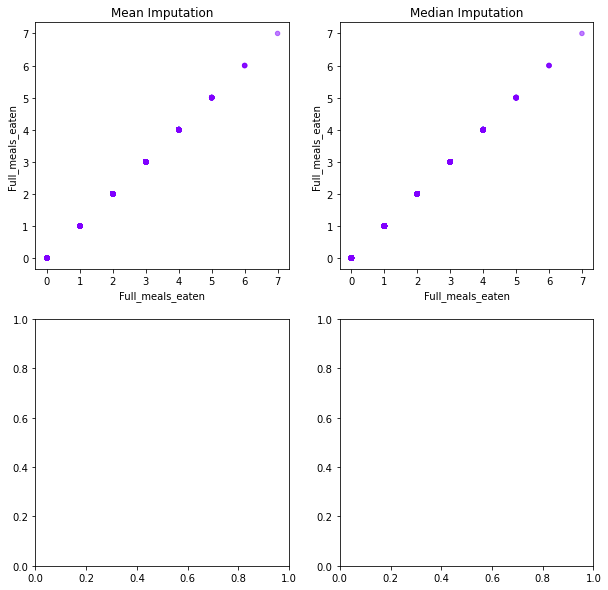

In [186]:
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(10, 10))
imputations = {'Mean Imputation': diabetes_mean, 'Median Imputation': diabetes_median}

nullity = df['Full_meals_eaten'].isnull()
# +diabetes['Children'].isnull()

for ax, df_key in zip(axes.flatten(), imputations):
    print("DF", df_key)
    imputations[df_key].plot(x='Full_meals_eaten', y='Full_meals_eaten', kind='scatter',
        alpha=0.5, c=nullity, cmap='rainbow', ax=ax,
        colorbar=False, title=df_key)

<AxesSubplot:title={'center':'Ozone'}>

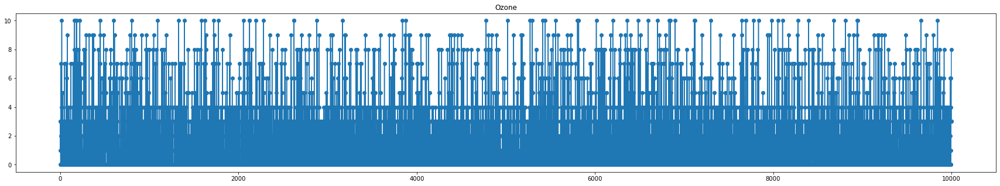

In [191]:
df['Children'].plot(title='Ozone', marker='o', figsize=(30, 5))

In [112]:
import numpy as np
from sklearn.impute import SimpleImputer
imp_mean = SimpleImputer(missing_values=np.nan, strategy='mean')
imp_mean.fit([[7]])

X = [[np.nan]]
print(imp_mean.transform(X))


imp_mean = SimpleImputer(missing_values=np.nan, strategy='mean')
# imp_mean.fit([[7]])

# Y = df["Children"].array.reshape(-1, 1)
z = imp_mean.fit_transform(df["Children"].array.reshape(-1, 1))
display(z)
z.unique()

SimpleImputer()

[[7.]]


array([[1.],
       [3.],
       [3.],
       ...,
       [3.],
       [3.],
       [8.]])

AttributeError: 'numpy.ndarray' object has no attribute 'unique'

### Re-Expression Categories Treatment

### Other Data Cleaning Treatment

## D2: Justification of Mitigation Methods

## D3: Summary of the Outcomes

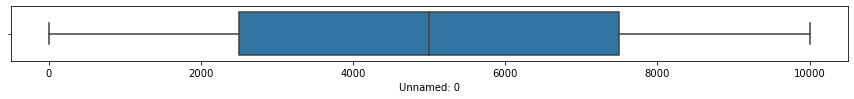

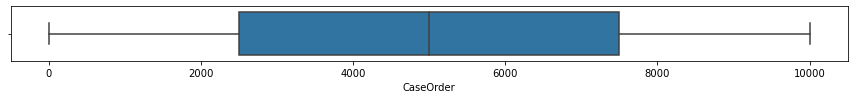

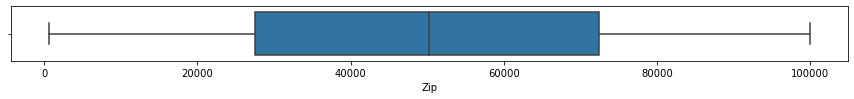

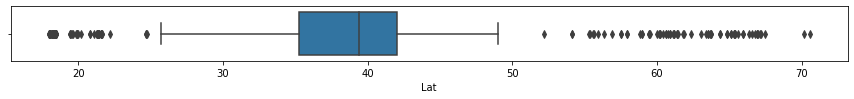

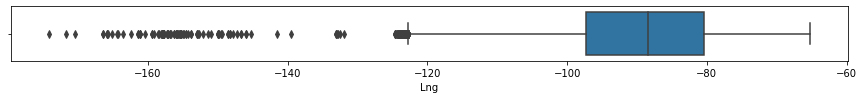

...

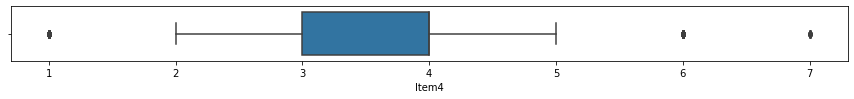

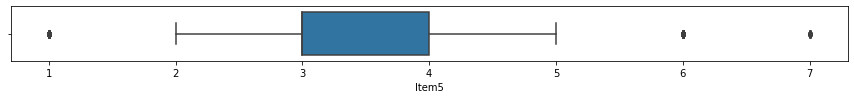

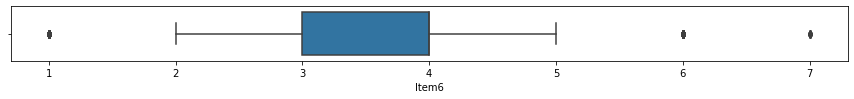

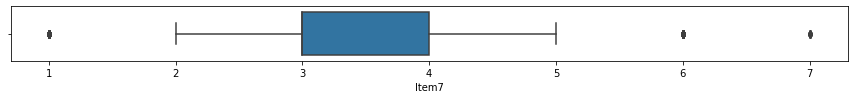

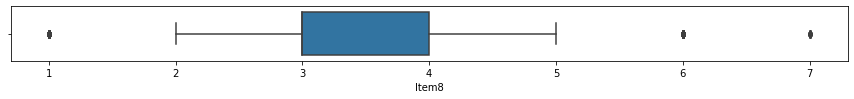

In [1099]:
create_boxplots(treated_df)

## D4: Mitigation Code 

## D5: Clean Data

## D6: Limitations

## D7: Impact of the Limitations

## E1. Principal Components

## E2. Criteria Used

## E3. Benefits

# Part IV. Supporting Documents
---

## F. Video

## G. Web Sources

- https://stackoverflow.com/q/47139203
- https://stackoverflow.com/a/57649212
- https://datascience.stackexchange.com/questions/60955/how-to-check-all-values-in-particular-column-has-same-data-type-or-not
- https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.reset_index.html
- https://stackoverflow.com/questions/40339886/pandas-concat-generates-nan-values
- https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.select_dtypes.htmlhttps://pandas.pydata.org/docs/reference/api/pandas.DataFrame.select_dtypes.html
- https://stackoverflow.com/questions/43392588/how-to-increase-the-figure-size-of-dataframe-hist-for-pandas-0-11-0
- https://numpy.org/doc/stable/reference/generated/numpy.all.html
- https://stackoverflow.com/a/53585379
- https://stackoverflow.com/questions/31029560/plotting-categorical-data-with-pandas-and-matplotlib
- https://stackoverflow.com/questions/43392588/how-to-increase-the-figure-size-of-dataframe-hist-for-pandas-0-11-0
- https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.select_dtypes.html
- https://datatofish.com/check-nan-pandas-dataframe/
- https://stackoverflow.com/questions/22391433/count-the-frequency-that-a-value-occurs-in-a-dataframe-column
-
-
-
-
-
-
-
-
-
-
-
-
-
-
-
-
-
-
-
-
-
-
-
-
-
-
-
-

## H. Sources/References

In [ ]:
df['user_type'].astype('category')
df['user_type'].dtype == "category"

In [ ]:
df.Stroke.unique()

In [ ]:
df.corr()
# Create the correlation matrix
corr = df.corr()

# Draw the heatmap
sns.heatmap(corr, center=0, linewidths=1, annot=True, fmt=".2f")
plt.show()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

In [ ]:
plt.hist(df['Additional_charges'])
plt.title('Additional_charges')


In [833]:
# # Create statistics dictionary for aggregation function
# statistics = {'user_birth_year': 'min', 'duration': 'mean'}

# # Group by ride_id and compute new statistics
# ride_unique = ride_dup.groupby('ride_id').agg(statistics).reset_index()

# # Find duplicated values again
# duplicates = ride_unique.duplicated(subset = 'ride_id', keep = False)
# duplicated_rides = ride_unique[duplicates == True]

# # Assert duplicates are processed
# assert duplicated_rides.shape[0] == 0